## Шаг 1. Загрузка входных данных

### Откройте файлы с данными и сохранить в датафреймы 

In [1]:
!pip install scikit-learn==1.1.3

  Using cached scikit_learn-1.1.3-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (30.8 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.4.2
    Uninstalling scikit-learn-1.4.2:
      Successfully uninstalled scikit-learn-1.4.2


In [2]:
!pip install -U scikit-learn

  Using cached scikit_learn-1.4.2-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (12.2 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.1.3
    Uninstalling scikit-learn-1.1.3:
      Successfully uninstalled scikit-learn-1.1.3


In [3]:
!pip install shap

In [4]:
!pip install phik

In [5]:
!pip install mlxtend -q

Импортируем библиотеки, загружаем данные по market_file, market_money, market_time, money и сохраняем их в датафреймы

In [6]:
# импортируем необходимые библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from phik import phik_matrix
from phik.report import plot_correlation_matrix

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.impute import SimpleImputer 

from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.dummy import DummyClassifier
from sklearn.inspection import permutation_importance
from sklearn.pipeline import Pipeline

from sklearn.compose import ColumnTransformer

from sklearn.preprocessing import (
    OneHotEncoder, 
    OrdinalEncoder, 
    StandardScaler, 
    MinMaxScaler, 
    RobustScaler
)

from sklearn.metrics import (
    f1_score, 
    roc_auc_score, 
    accuracy_score, 
    precision_score, 
    recall_score, 
    confusion_matrix, 
    ConfusionMatrixDisplay, 
    classification_report)

from mlxtend.plotting import plot_decision_regions

Создадим функцию для вывода данных на экран (Исходный датафрейм, Общая информация о датафрейме, Количество пустых значений в датафрейме, Описательная статистика, Список с названием столбцов) 

In [7]:
def my_func(x):
    print('------------- Исходный датафрейм -------------')
    display(x.head())
    print('')
    print('')
    print('------------- Общая информация о датафрейме -------------')
    print('')
    print('')
    display(x.info(memory_usage='deep'))
    print('------------- Количество пустых значений в датафрейме -------------')
    print('')
    print('')
    display(x.isna().sum())
    print('------------- Количество явных дубликатов в датафрейме -------------')
    display(x.duplicated().sum())
    print('')
    print('')
    print('------------- Описательная статистика -------------')
    display(x.describe())
    print('------------- Список с названием столбцов -------------')
    display(x.columns)

Создадим функцию для замены пробелов на нижнее подчеркивание. Приведем все названия столбцов к змеинному регистру и маленьким буквам

In [8]:
def columns_remove_spaces(df):
    '''
    Функция для замены пробелов на нижнее подчеркивание. 
    Приведем все названия столбцов к змеинному регистру и маленьким буквам
    ''' 
    df.columns = df.columns.str.replace(' ', '_').str.lower()

In [9]:
market_file = pd.read_csv('/datasets/market_file.csv', sep=',', decimal = ',')
columns_remove_spaces(market_file)
my_func(market_file)

------------- Исходный датафрейм -------------


,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
0,215348,Снизилась,премиум,да,3.4,5,121,0.0,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандартт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандартт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандартт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2




------------- Общая информация о датафрейме -------------


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype 
---  ------                               --------------  ----- 
 0   id                                   1300 non-null   int64 
 1   покупательская_активность            1300 non-null   object
 2   тип_сервиса                          1300 non-null   object
 3   разрешить_сообщать                   1300 non-null   object
 4   маркет_актив_6_мес                   1300 non-null   object
 5   маркет_актив_тек_мес                 1300 non-null   int64 
 6   длительность                         1300 non-null   int64 
 7   акционные_покупки                    1300 non-null   object
 8   популярная_категория                 1300 non-null   object
 9   средний_просмотр_категорий_за_визит  1300 non-null   int64 
 10  неоплаченные_продукты_штук_квартал   1300 non-

None

------------- Количество пустых значений в датафрейме -------------




id                                     0
покупательская_активность              0
тип_сервиса                            0
разрешить_сообщать                     0
маркет_актив_6_мес                     0
маркет_актив_тек_мес                   0
длительность                           0
акционные_покупки                      0
популярная_категория                   0
средний_просмотр_категорий_за_визит    0
неоплаченные_продукты_штук_квартал     0
ошибка_сервиса                         0
страниц_за_визит                       0
dtype: int64

------------- Количество явных дубликатов в датафрейме -------------


0



------------- Описательная статистика -------------


,id,маркет_актив_тек_мес,длительность,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
count,1300.000000,1300.000000,1300.000000,1300.00000,1300.000000,1300.000000,1300.000000
mean,215997.500000,4.011538,601.898462,3.27000,2.840000,4.185385,8.176923
std,375.421985,0.696868,249.856289,1.35535,1.971451,1.955298,3.978126
min,215348.000000,3.000000,110.000000,1.00000,0.000000,0.000000,1.000000
25%,215672.750000,4.000000,405.500000,2.00000,1.000000,3.000000,5.000000
50%,215997.500000,4.000000,606.000000,3.00000,3.000000,4.000000,8.000000
75%,216322.250000,4.000000,806.000000,4.00000,4.000000,6.000000,11.000000
max,216647.000000,5.000000,1079.000000,6.00000,10.000000,9.000000,20.000000


------------- Список с названием столбцов -------------


Index(['id', 'покупательская_активность', 'тип_сервиса', 'разрешить_сообщать',
       'маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность',
       'акционные_покупки', 'популярная_категория',
       'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит'],
      dtype='object')

In [10]:
market_money = pd.read_csv('/datasets/market_money.csv', sep=',', decimal = ',')
columns_remove_spaces(market_money)
my_func(market_money)

------------- Исходный датафрейм -------------


,id,период,выручка
0,215348,препредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
3,215349,препредыдущий_месяц,4472.0
4,215349,текущий_месяц,4971.6




------------- Общая информация о датафрейме -------------


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   id       3900 non-null   int64 
 1   период   3900 non-null   object
 2   выручка  3900 non-null   object
dtypes: int64(1), object(2)
memory usage: 704.7 KB


None

------------- Количество пустых значений в датафрейме -------------




id         0
период     0
выручка    0
dtype: int64

------------- Количество явных дубликатов в датафрейме -------------


0



------------- Описательная статистика -------------


,id
count,3900.000000
mean,215997.500000
std,375.325686
min,215348.000000
25%,215672.750000
50%,215997.500000
75%,216322.250000
max,216647.000000


------------- Список с названием столбцов -------------


Index(['id', 'период', 'выручка'], dtype='object')

In [11]:
market_time = pd.read_csv('/datasets/market_time.csv', sep=',', decimal = ',')
columns_remove_spaces(market_time)
my_func(market_time)

------------- Исходный датафрейм -------------


,id,период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13




------------- Общая информация о датафрейме -------------


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2600 entries, 0 to 2599
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2600 non-null   int64 
 1   период  2600 non-null   object
 2   минут   2600 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 322.6 KB


None

------------- Количество пустых значений в датафрейме -------------




id        0
период    0
минут     0
dtype: int64

------------- Количество явных дубликатов в датафрейме -------------


0



------------- Описательная статистика -------------


,id,минут
count,2600.000000,2600.000000
mean,215997.500000,13.336154
std,375.349754,4.080198
min,215348.000000,4.000000
25%,215672.750000,10.000000
50%,215997.500000,13.000000
75%,216322.250000,16.000000
max,216647.000000,23.000000


------------- Список с названием столбцов -------------


Index(['id', 'период', 'минут'], dtype='object')

In [12]:
money = pd.read_csv('/datasets/money.csv', sep=';', decimal = ',')
columns_remove_spaces(money)
my_func(money)

------------- Исходный датафрейм -------------


,id,прибыль
0,215348,0.98
1,215349,4.16
2,215350,3.13
3,215351,4.87
4,215352,4.21




------------- Общая информация о датафрейме -------------


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       1300 non-null   int64  
 1   прибыль  1300 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 20.4 KB


None

------------- Количество пустых значений в датафрейме -------------




id         0
прибыль    0
dtype: int64

------------- Количество явных дубликатов в датафрейме -------------


0



------------- Описательная статистика -------------


,id,прибыль
count,1300.000000,1300.000000
mean,215997.500000,3.996631
std,375.421985,1.013722
min,215348.000000,0.860000
25%,215672.750000,3.300000
50%,215997.500000,4.045000
75%,216322.250000,4.670000
max,216647.000000,7.430000


------------- Список с названием столбцов -------------


Index(['id', 'прибыль'], dtype='object')

In [13]:
display(f'В датафрейме market_file: {market_file.shape[0]} строк')
display(f'В датафрейме market_money: {market_money.shape[0]} строк')
display(f'В датафрейме market_time: {market_time.shape[0]} строк')
display(f'В датафрейме money: {money.shape[0]} строк')

'В датафрейме market_file: 1300 строк'

'В датафрейме market_money: 3900 строк'

'В датафрейме market_time: 2600 строк'

'В датафрейме money: 1300 строк'

In [14]:
display(f'В датафрейме market_file: {market_file.shape[1]} столбцов')
display(f'В датафрейме market_money: {market_money.shape[1]} столбцов')
display(f'В датафрейме market_time: {market_time.shape[1]} столбца')
display(f'В датафрейме money: {money.shape[1]} столбца')

'В датафрейме market_file: 13 столбцов'

'В датафрейме market_money: 3 столбцов'

'В датафрейме market_time: 3 столбца'

'В датафрейме money: 2 столбца'

**Промежуточный вывод:** Все данные по датафреймам загружены корректно. Как видно по типу данных, некоторые столбцы не соответствуют типу данных, в следующем разделе будем изменять.

- В датафрейме market_file: 1300 строк, 13 столбцов;
- В датафрейме market_money: 3900 строк, 3 столбцов;
- В датафрейме market_time: 2600 строк, 3 столбца;
- В датафрейме money: 1300 строк, 2 столбца.

## Шаг 2. Предобработка данных

###  Проверьте типы данных

- Проверим типы данных в датафрейме и преобразуем их там, где это необходимо.

**market_file**

In [15]:
market_file.dtypes

id                                      int64
покупательская_активность              object
тип_сервиса                            object
разрешить_сообщать                     object
маркет_актив_6_мес                     object
маркет_актив_тек_мес                    int64
длительность                            int64
акционные_покупки                      object
популярная_категория                   object
средний_просмотр_категорий_за_визит     int64
неоплаченные_продукты_штук_квартал      int64
ошибка_сервиса                          int64
страниц_за_визит                        int64
dtype: object

Некоторые колонки при загрузке датафреймов были определены как object исправим эти колонки на float

In [16]:
def object_to_float(df, columns):
    for col in columns:
        df[col] = df[col].astype('float64')

In [17]:
object_to_float(market_file, ['маркет_актив_6_мес', 'акционные_покупки'])

In [18]:
market_file.dtypes

id                                       int64
покупательская_активность               object
тип_сервиса                             object
разрешить_сообщать                      object
маркет_актив_6_мес                     float64
маркет_актив_тек_мес                     int64
длительность                             int64
акционные_покупки                      float64
популярная_категория                    object
средний_просмотр_категорий_за_визит      int64
неоплаченные_продукты_штук_квартал       int64
ошибка_сервиса                           int64
страниц_за_визит                         int64
dtype: object

Используем функцию для приведения в столбцах текста к змеинному регистру, замене пробелов на нижнее подчеркивание и приведение слов к прописным буквам

In [19]:
def replace_columns(df, columns):
    for col in columns:
        df[col] = df[col].str.replace(' ', '_').str.lower()

Заменим дублирующие названия в столбцах исправим опечатки, так же проверим уникальные значения в категориальных столбцах

In [20]:
market_file['тип_сервиса'].unique()

array(['премиум', 'стандартт', 'стандарт'], dtype=object)

Заменим опечатки в столбце тип_сервиса "стандартт" на "стандарт"

In [21]:
market_file['тип_сервиса'] = market_file['тип_сервиса'].str.replace('стандартт', 'стандарт')

In [22]:
replace_columns(market_file, ['популярная_категория', 'покупательская_активность'])

In [23]:
market_file['популярная_категория'].unique()

array(['товары_для_детей', 'домашний_текстиль', 'косметика_и_аксесуары',
       'техника_для_красоты_и_здоровья', 'кухонная_посуда',
       'мелкая_бытовая_техника_и_электроника'], dtype=object)

Заменим опечатку в столбце популярная_категория 'косметика_и_аксесуары' на 'косметика_и_аксессуары'

In [24]:
market_file['популярная_категория'] = market_file['популярная_категория'].str.replace('косметика_и_аксесуары',
                                                                                      'косметика_и_аксессуары')

In [25]:
market_file['популярная_категория'].unique()

array(['товары_для_детей', 'домашний_текстиль', 'косметика_и_аксессуары',
       'техника_для_красоты_и_здоровья', 'кухонная_посуда',
       'мелкая_бытовая_техника_и_электроника'], dtype=object)

In [26]:
market_file['покупательская_активность'].unique()

array(['снизилась', 'прежний_уровень'], dtype=object)

In [27]:
market_file['тип_сервиса'].unique()

array(['премиум', 'стандарт'], dtype=object)

In [28]:
market_file['разрешить_сообщать'].unique()

array(['да', 'нет'], dtype=object)

In [29]:
display(market_file.head())

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
0,215348,снизилась,премиум,да,3.4,5,121,0.00,товары_для_детей,6,2,1,5
1,215349,снизилась,премиум,да,4.4,4,819,0.75,товары_для_детей,4,4,2,5
2,215350,снизилась,стандарт,нет,4.9,3,539,0.14,домашний_текстиль,5,2,1,5
3,215351,снизилась,стандарт,да,3.2,5,896,0.99,товары_для_детей,5,0,6,4
4,215352,снизилась,стандарт,нет,5.1,3,1064,0.94,товары_для_детей,3,2,3,2


**market_money**

In [30]:
market_money.dtypes

id          int64
период     object
выручка    object
dtype: object

In [31]:
object_to_float(market_money, ['выручка'])

In [32]:
market_money.dtypes

id           int64
период      object
выручка    float64
dtype: object

In [33]:
market_money['период'].unique()

array(['препредыдущий_месяц', 'текущий_месяц', 'предыдущий_месяц'],
      dtype=object)

Заменим опечатки в столбце период "препредыдущий_месяц" на "предыдущий_месяц"

In [34]:
market_money['период'] = market_money['период'].str.replace('препредыдущий_месяц', 'предпредыдущий_месяц')

In [35]:
market_money['период'].unique()

array(['предпредыдущий_месяц', 'текущий_месяц', 'предыдущий_месяц'],
      dtype=object)

In [36]:
print(market_money['период'].value_counts())

предыдущий_месяц        1300
текущий_месяц           1300
предпредыдущий_месяц    1300
Name: период, dtype: int64


In [37]:
display(market_money.head())

,id,период,выручка
0,215348,предпредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
3,215349,предпредыдущий_месяц,4472.0
4,215349,текущий_месяц,4971.6


**market_time**

Тип данных в столбцах определен правильно. Приведем название столбцов к змеинному регистру.

In [38]:
market_time.dtypes

id         int64
период    object
минут      int64
dtype: object

In [39]:
market_time['период'].unique()

array(['текущий_месяц', 'предыдцщий_месяц'], dtype=object)

Заменим опечатку в столбце предыдцщий_месяц на предыдущий_месяц

In [40]:
market_time['период'] = market_time['период'].str.replace('предыдцщий_месяц', 'предыдущий_месяц')
market_time['период'].unique()

array(['текущий_месяц', 'предыдущий_месяц'], dtype=object)

In [41]:
display(market_time.head())

,id,период,минут
0,215348,текущий_месяц,14
1,215348,предыдущий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдущий_месяц,12
4,215350,текущий_месяц,13


**money**

In [42]:
money.dtypes

id           int64
прибыль    float64
dtype: object

**Промежуточный вывод:** Во всех датафреймах типы данных скорректны и приведены к нижнему регистру. Где были опечатки в категориальных столбцах исправлены.

### Проверим наличие пропущенных значений и дубликатов в датафреймах. Обработайте их, если такие значения присутствуют.

In [43]:
print('Колличество пропущенных значений в market_file:', market_file.isna().sum())

Колличество пропущенных значений в market_file: id                                     0
покупательская_активность              0
тип_сервиса                            0
разрешить_сообщать                     0
маркет_актив_6_мес                     0
маркет_актив_тек_мес                   0
длительность                           0
акционные_покупки                      0
популярная_категория                   0
средний_просмотр_категорий_за_визит    0
неоплаченные_продукты_штук_квартал     0
ошибка_сервиса                         0
страниц_за_визит                       0
dtype: int64


In [44]:
print('Колличество пропущенных значений в market_money:', market_money.isnull().sum())

Колличество пропущенных значений в market_money: id         0
период     0
выручка    0
dtype: int64


In [45]:
print('Колличество пропущенных значений в market_time:', market_time.isnull().sum())

Колличество пропущенных значений в market_time: id        0
период    0
минут     0
dtype: int64


In [46]:
print('Колличество пропущенных значений в money:', money.isnull().sum())

Колличество пропущенных значений в money: id         0
прибыль    0
dtype: int64


In [47]:
print('Колличество явных дубликатов в датасете market_file:', market_file.duplicated().sum())
print('Колличество явных дубликатов в датасете market_money:', market_money.duplicated().sum())
print('Колличество явных дубликатов в датасете market_time:', market_time.duplicated().sum())
print('Колличество явных дубликатов в датасете money:', money.duplicated().sum())

Колличество явных дубликатов в датасете market_file: 0
Колличество явных дубликатов в датасете market_money: 0
Колличество явных дубликатов в датасете market_time: 0
Колличество явных дубликатов в датасете money: 0


In [48]:
market_money = market_money.drop_duplicates()
print('Колличество явных дубликатов в датасете market_money:', market_money.duplicated().sum())

Колличество явных дубликатов в датасете market_money: 0


**Промежуточный вывод в предобработке данных:** 

- Проверили в датафреймах пропущенные значения, ни в одном из них их нет. 
- Проверили явные дубликаты, были обнаружены в небольшом количестве 5 штук в market_money решила удалили их.  
- Привели в столбцах текст к змеинному регистру, заменили пробелы на нижнее подчеркивание и привели слова прописным буквам.
- Заменили опечатки в столбцах.

## Шаг 3. Исследовательский анализ данных

Посмотрим визуально все графики

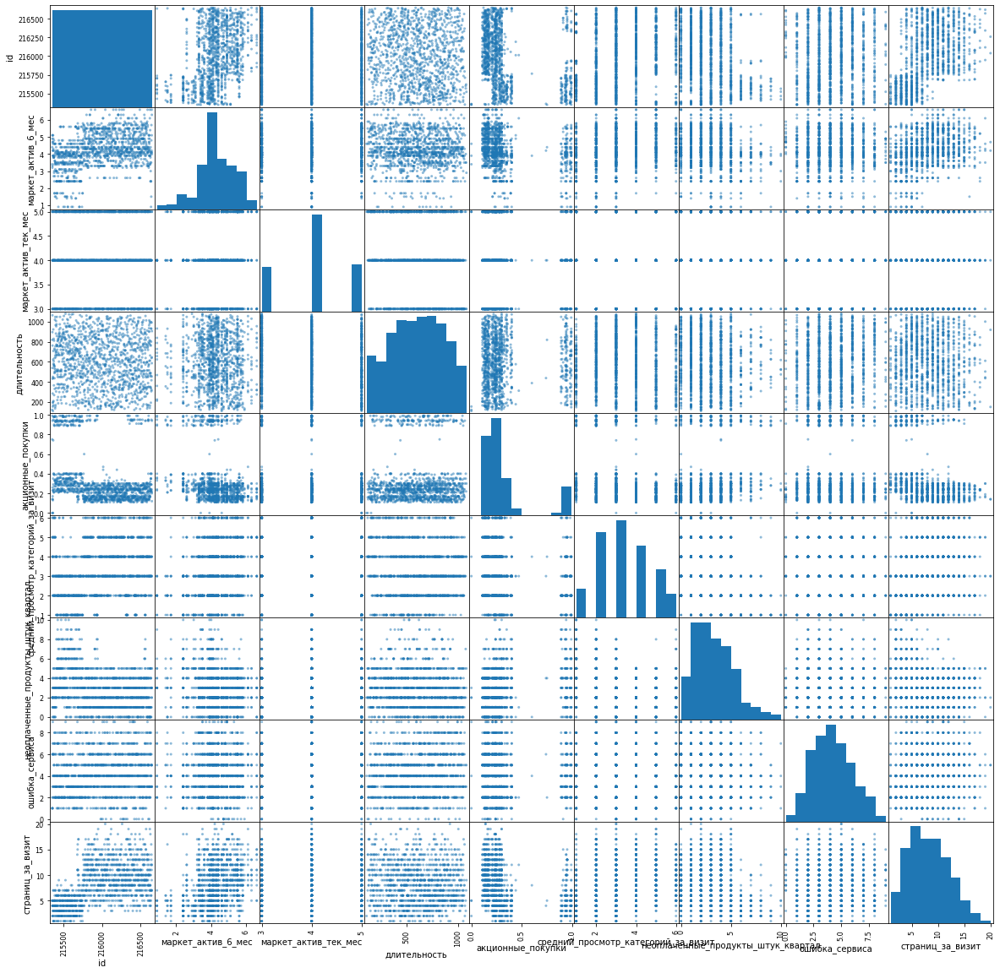

In [49]:
pd.plotting.scatter_matrix(market_file, figsize=(20, 20));

### Исследовательский анализ `market_file`

In [50]:
# выведем на экран типы данных market_file
print(f'Типы данных "market_file":\n{market_file.dtypes}')

Типы данных "market_file":
id                                       int64
покупательская_активность               object
тип_сервиса                             object
разрешить_сообщать                      object
маркет_актив_6_мес                     float64
маркет_актив_тек_мес                     int64
длительность                             int64
акционные_покупки                      float64
популярная_категория                    object
средний_просмотр_категорий_за_визит      int64
неоплаченные_продукты_штук_квартал       int64
ошибка_сервиса                           int64
страниц_за_визит                         int64
dtype: object


In [51]:
# функция для анализа числовых признаков
def hist(data):
    '''
    Принимает переменную, содержащую столбцы с числовыми данными.
    Если столбцов больше одного, то применять через цикл, перебирая 
    каждый столбец данной функцией в теле цикла.
    
    Args:
        data (class 'pandas.core.frame.DataFrame', class 'pandas.core.series.Series') - переменная с числовыми столбцами
        
    Returns:
        hist() - вывод гистограммы с распределением наблюдений в столбце
        boxplot() - вывод ящика с усами
        describe() - вывод описательной статистики столбца
    '''
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    plt.subplot(1,2,1)
    plt.hist(data, bins=30, ec='black', lw=1, color='green')
    plt.title('Гистограмма', size=15)
    plt.ylabel('Частота', size=12)
    plt.grid(linestyle='dashed')
    plt.subplot(1,2,2)
    plt.boxplot(data, vert=False)
    plt.title('Ящик с усами', size=15)
    plt.grid(linestyle='dashed')
    plt.show()
    print('Описательная статистика:')
    print(data.describe())
    print('                                                                                                  ')
    print('                                                                                                  ')
    print('--------------------------------------------------------------------------------------------------')

**Числовые признаки**

Исследовательский анализ числовых данных market_file

Столбец "маркет_актив_6_мес"


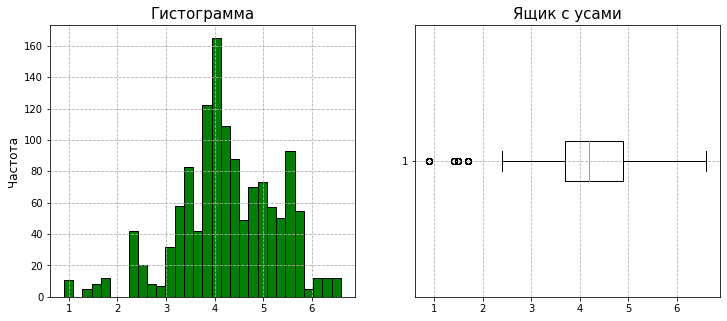

Описательная статистика:
count    1300.000000
mean        4.253769
std         1.014814
min         0.900000
25%         3.700000
50%         4.200000
75%         4.900000
max         6.600000
Name: маркет_актив_6_мес, dtype: float64
                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------
Столбец "маркет_актив_тек_мес"


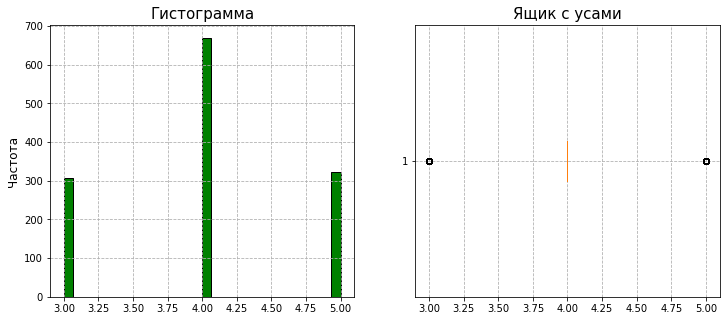

Описательная статистика:
count    1300.000000
mean        4.011538
std         0.696868
min         3.000000
25%         4.000000
50%         4.000000
75%         4.000000
max         5.000000
Name: маркет_актив_тек_мес, dtype: float64
                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------
Столбец "длительность"


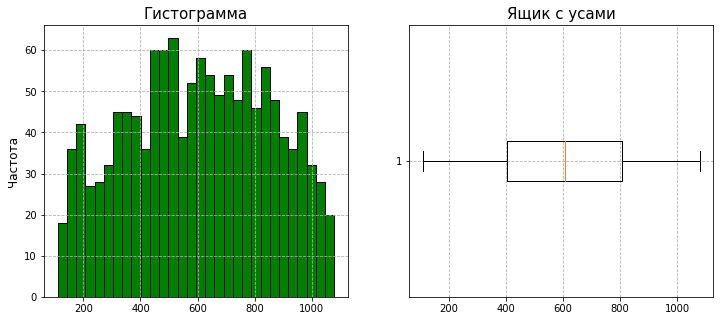

Описательная статистика:
count    1300.000000
mean      601.898462
std       249.856289
min       110.000000
25%       405.500000
50%       606.000000
75%       806.000000
max      1079.000000
Name: длительность, dtype: float64
                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------
Столбец "акционные_покупки"


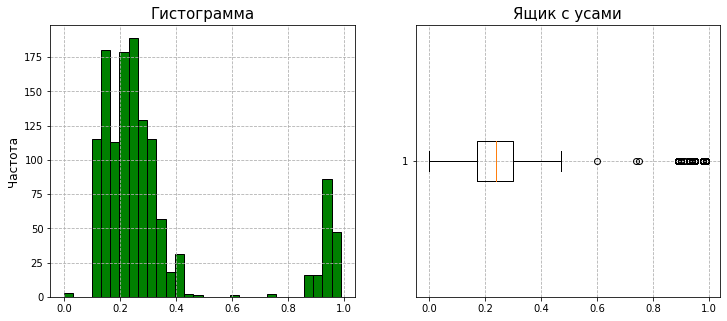

Описательная статистика:
count    1300.000000
mean        0.319808
std         0.249843
min         0.000000
25%         0.170000
50%         0.240000
75%         0.300000
max         0.990000
Name: акционные_покупки, dtype: float64
                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------
Столбец "средний_просмотр_категорий_за_визит"


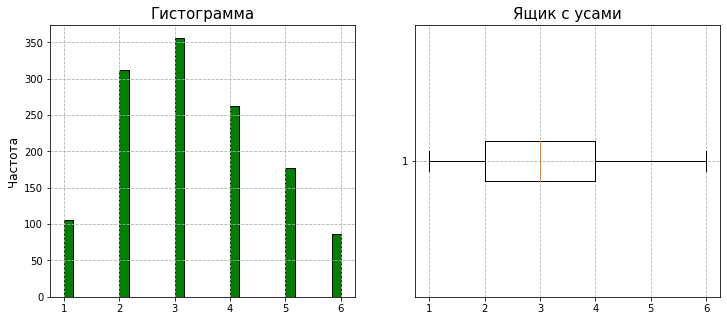

Описательная статистика:
count    1300.00000
mean        3.27000
std         1.35535
min         1.00000
25%         2.00000
50%         3.00000
75%         4.00000
max         6.00000
Name: средний_просмотр_категорий_за_визит, dtype: float64
                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------
Столбец "неоплаченные_продукты_штук_квартал"


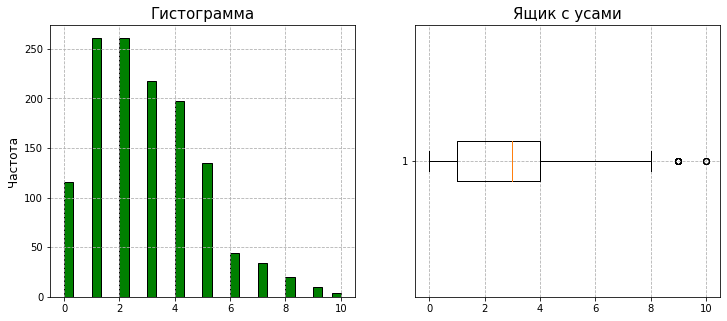

Описательная статистика:
count    1300.000000
mean        2.840000
std         1.971451
min         0.000000
25%         1.000000
50%         3.000000
75%         4.000000
max        10.000000
Name: неоплаченные_продукты_штук_квартал, dtype: float64
                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------
Столбец "ошибка_сервиса"


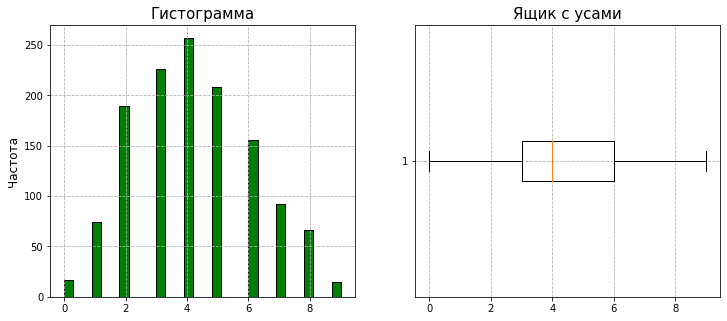

Описательная статистика:
count    1300.000000
mean        4.185385
std         1.955298
min         0.000000
25%         3.000000
50%         4.000000
75%         6.000000
max         9.000000
Name: ошибка_сервиса, dtype: float64
                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------
Столбец "страниц_за_визит"


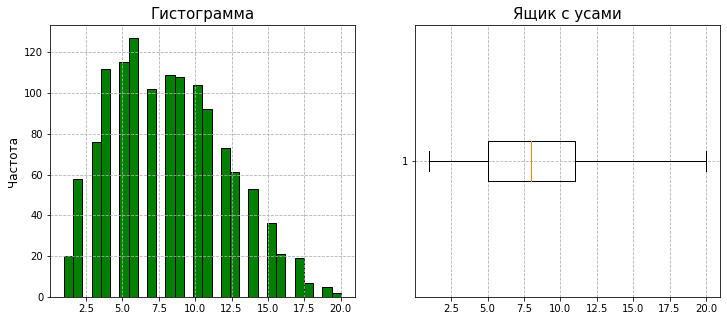

Описательная статистика:
count    1300.000000
mean        8.176923
std         3.978126
min         1.000000
25%         5.000000
50%         8.000000
75%        11.000000
max        20.000000
Name: страниц_за_визит, dtype: float64
                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------


In [52]:
# создаём переменную, сожержащую только числовые столбцы market_file (без id)
market_file_num = market_file[market_file.select_dtypes(include='number').columns].drop(['id'], axis=1)

# применяем функцию hist
print('Исследовательский анализ числовых данных market_file\n')
for i in market_file_num:
    print(f'Столбец "{i}"')
    hist(market_file_num[i])
    plt.show()

**Категориальные признаки**

In [53]:
# задаём палитру цветов
colors = sns.color_palette('bright')

# функция для визуализации категориальных признаков
def cat_func(data):
    '''
    Принимает переменную, содержащую столбцы с категориальными данными.
    Предварительно необходимо создать переменную colors с палитрой цветов.
    
    Args:
        data (class 'pandas.core.frame.DataFrame', class 'pandas.core.series.Series') - переменная категориальными столбцами

    Returns:
        barh - столбчатая диаграмма
        pie - круговая диаграмма
    '''   
    print()
    print(data.value_counts())
    data.value_counts(ascending=True).plot(kind='barh', 
                             color='grey', 
                             alpha=0.8)
    plt.title('Столбчатая диаграмма', size=15)
    plt.xticks(rotation=0)
    plt.xlabel('Количество', size=12)
    plt.ylabel('Значения', size=12)
    plt.show()
    print('                                                                                                  ')
    print('                                                                                                  ')
    print('--------------------------------------------------------------------------------------------------')
    data.value_counts().plot(kind='pie', 
                             legend=True, 
                             autopct='%.2f%%', 
                             textprops={'color':'black', 'size':13}, 
                             figsize=(8, 6), colors=colors)
    plt.legend(bbox_to_anchor=(1.2, 1), prop={'size': 13})
    plt.title('Круговая диаграмма', size=15)
    plt.ylabel(None)
    plt.show()
    print('                                                                                                  ')
    print('                                                                                                  ')
    print('--------------------------------------------------------------------------------------------------')

Исследовательский анализ категориальных данных market_file

Столбец "покупательская_активность"

прежний_уровень    802
снизилась          498
Name: покупательская_активность, dtype: int64


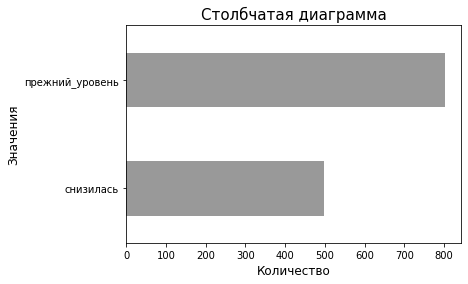

                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------


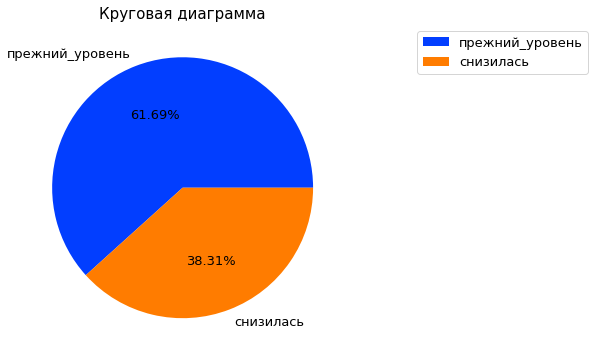

                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------
Столбец "тип_сервиса"

стандарт    924
премиум     376
Name: тип_сервиса, dtype: int64


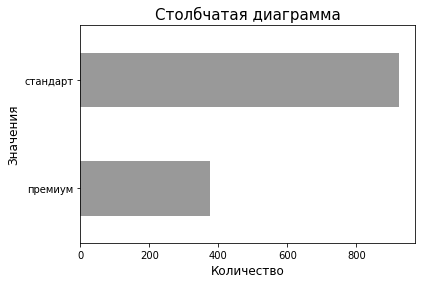

                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------


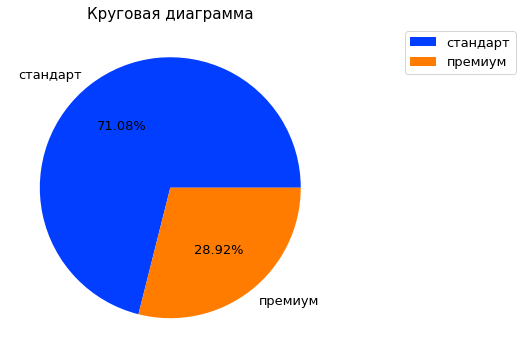

                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------
Столбец "разрешить_сообщать"

да     962
нет    338
Name: разрешить_сообщать, dtype: int64


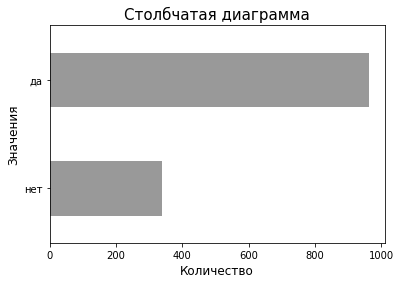

                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------


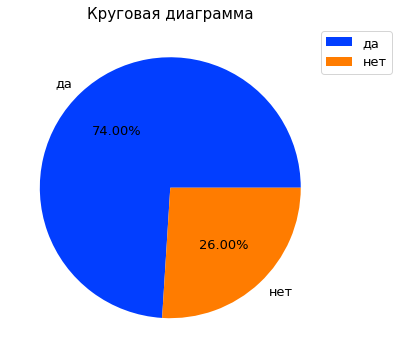

                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------
Столбец "популярная_категория"

товары_для_детей                        330
домашний_текстиль                       251
косметика_и_аксессуары                  223
техника_для_красоты_и_здоровья          184
мелкая_бытовая_техника_и_электроника    174
кухонная_посуда                         138
Name: популярная_категория, dtype: int64


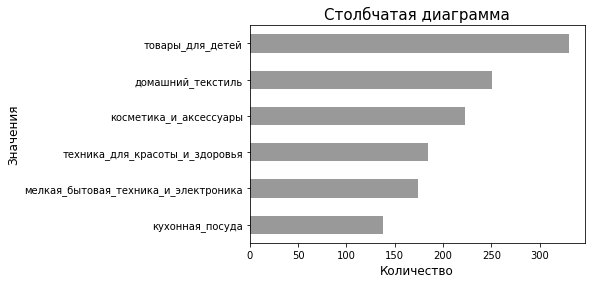

                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------


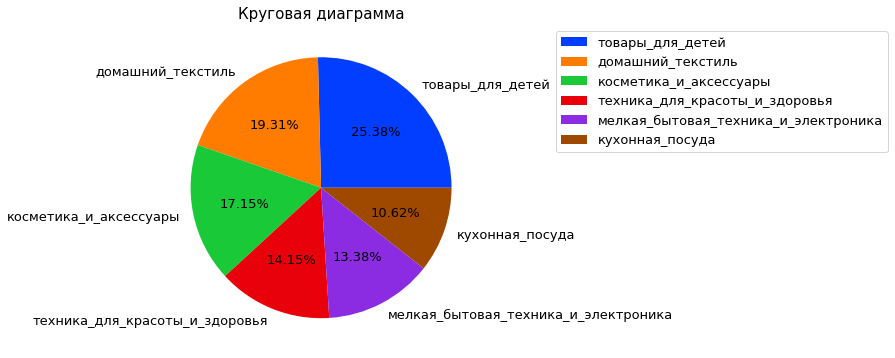

                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------


In [54]:
# создаём переменную, сожержащую только категориальные столбцы
market_file_cat = market_file[market_file.select_dtypes(exclude='number').columns]

# применяем функцию для визуализации категориальных признаков
print('Исследовательский анализ категориальных данных market_file\n')
for i in market_file_cat:
    print(f'Столбец "{i}"')
    cat_func(market_file_cat[i])
    plt.show()

**Промежуточный вывод в датафрейме market_file:**

**Числовые признаки**

- `маркет_актив_6 мес:` распределение похоже на нормальное. С локальными незначительными пиками. Среднее - 4.25, Медиана - 4,20, Min - 0,9, Max - 6,60;
- `маркет_актив_тек_мес:` распределение мультимодальное. Наблюдаем три пика: 3.0, 4.0 и 5.0. Среднее - 4.01, Медиана - 4.00, Min - 3.0, Max - 5.00;
- `длительность:` распределение стремится к нормальному. Самый "свежий" пользователь зарегистрировался 110 дней назад. Есть небольшие локальные пики на 200, 500, 800 и около 1000. Среднее - 601.90, Медиана - 606.00, Min - 110.0, Max - 1079.00;
- `акционные_покупки:` распределение бимодальное. Есть часть покупателей, которая за рассматриваемый период имеет долю покупок, совершённых по акции, близкую к единице. Среднее - 0.32, Медиана - 0.24, Min - 0.0, Max - 0.99;
- `средний_просмотр_категорий_за_визит:` распределение похоже на нормальное. Среднее - 3.27, Медиана - 3.00, Min - 1.0, Max - 6.00;

- `неоплаченные_продукты_штук_квартал:` распределение похоже на нормальное, но скошенное. Среднее - 2.84, Медиана - 3.00, Min - 0.0, Max - 10.00;
- `ошибка_сервиса:` распределение нормальное. Среднее - 4.19, Медиана - 4.00, Min - 0.0, Max - 9.00;
- `страниц_за_визит:` распределение нормальное. Среднее - 8.18, Медиана - 8.00, Min - 1.0, Max - 20.00.

**Категориальные признаки**

- `покупательская_активность:` 802 пользователя имеюют прежний_уровень (61.69%), 498 пользователей активность снизилась (38.31%);
- `тип_сервиса:` 924 раза встречается стандарт (71.08%), остальные наблюдения - премиум 376 раз (28.92%);
- `разрешить_сообщать:` 962 раза встречается да (74.00%), остальные наблюдения - 338 раз (26.00%);
- `популярная_категория:` 330 наблюдений - Товары для детей (25.38%), 251 наблюдений - Домашний текстиль (19.31%), 223 наблюдений - Косметика и аксессуары (17.15%), 184 наблюдений - Техника для красоты и здоровья (14,15%), 174 наблюдений - Мелкая бытовая техника и электроника (13,38%), 138 наблюдений - Кухонная посуда (10,62%).                         

### Исследовательский анализ `market_money`

In [55]:
# выведем на экран типы данных market_money
print(f'Типы данных "market_money":\n{market_money.dtypes}')

Типы данных "market_money":
id           int64
период      object
выручка    float64
dtype: object


**Числовые признаки**

Исследовательский анализ числовых данных market_money

Столбец "выручка"


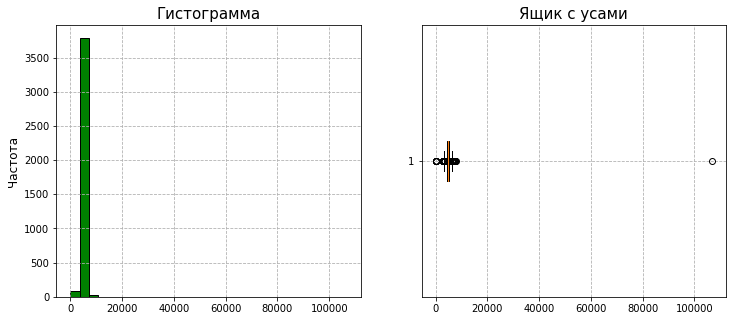

Описательная статистика:
count      3900.000000
mean       5025.696051
std        1777.704104
min           0.000000
25%        4590.150000
50%        4957.500000
75%        5363.000000
max      106862.200000
Name: выручка, dtype: float64
                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------


In [56]:
# создаём переменную, сожержащую только числовые столбцы market_money (без id)
market_money_num = market_money[market_money.select_dtypes(include='number').columns].drop(['id'], axis=1)

# применяем функцию hist
print('Исследовательский анализ числовых данных market_money\n')
for i in market_money_num:
    print(f'Столбец "{i}"')
    hist(market_money_num[i])
    plt.show()

В столбце `выручка` видно есть какие то аномалии.

In [57]:
print(f'Минимальное значение выручки {market_money["выручка"].min()}')

Минимальное значение выручки 0.0


In [58]:
print(f'Максимальное значение выручки {market_money["выручка"].max()}')

Максимальное значение выручки 106862.2


В столбце `выручка` выявили два аномальных значения: 0.0 и 106862.2. Выбросы это или нет, сложно оценить. За рассматриваемый период покупатель мог как не совершать покупки вообще, так и совершить несколько нестандартных крупных покупок. Тем не менее, из-за этих двух значений имеем слишком мелкий масштаб на гистограмме.

In [59]:
# выведем строки с аномальными значениями выручки
market_money.query('выручка == 106862.2 or выручка == 0')

,id,период,выручка
0,215348,предпредыдущий_месяц,0.0
2,215348,предыдущий_месяц,0.0
28,215357,предпредыдущий_месяц,0.0
29,215357,предыдущий_месяц,0.0
34,215359,предыдущий_месяц,0.0
35,215359,предпредыдущий_месяц,0.0
98,215380,текущий_месяц,106862.2


Изучим выручки 4х пользователей за разные периоды.

In [60]:
# выводим на экран данные за разные периоды для пользователей с подозрительными выручками
market_money.query('id == 215348 or id == 215357 or id == 215359 or id == 215380')

,id,период,выручка
0,215348,предпредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
27,215357,текущий_месяц,5986.3
28,215357,предпредыдущий_месяц,0.0
29,215357,предыдущий_месяц,0.0
33,215359,текущий_месяц,4735.0
34,215359,предыдущий_месяц,0.0
35,215359,предпредыдущий_месяц,0.0
96,215380,предпредыдущий_месяц,5051.0


In [61]:
# выводим на экран медиану и среднее
print('Медиана:', round(market_money['выручка'].median(), 3))
print('Среднее:', round(market_money['выручка'].mean(), 3))

Медиана: 4957.5
Среднее: 5025.696


Пользователи с `id 215348, 215357 и 215359` начали совершать покупки только в текущем месяце. Причины могут быть следующие:

- возможно новые пользователи;
- возможно это совпадение, пользователи не покупают каждый месяц товары;
- возможно привлекла в текущем месяца какая-нибудь акция.

`id 215380` - этот пользователь, наоборот, показывает активность каждый месяц. Однако в текущем месяце выручка с данного пользователя более чем в 21 раз выше, чем средняя за предыдущие периоды. Выглядит подозрительно.

Попробуем посмотреть на распределение наблюдений без этих двух значений.

Исследовательский анализ числовых данных market_money

Столбец "выручка"


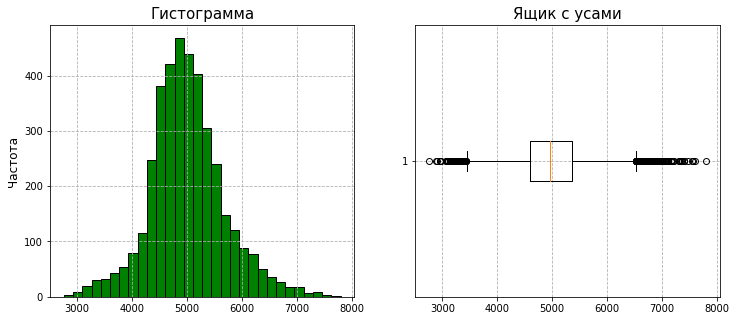

Описательная статистика:
count    3893.000000
mean     5007.282918
std       679.724898
min      2758.700000
25%      4592.000000
50%      4959.000000
75%      5363.000000
max      7799.400000
Name: выручка, dtype: float64
                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------


In [62]:
# создаём переменную для числовых столбцов market_money (без id) без аномальных значений
market_money_num = (market_money.query('0 < выручка < 106862.2')
                       [market_money.select_dtypes(include='number').columns]
                       .drop(['id'], axis=1))

# применяем функцию hist
print('Исследовательский анализ числовых данных market_money\n')
for i in market_money_num:
    print(f'Столбец "{i}"')
    hist(market_money_num[i])
    plt.show()

**Категориальные признаки**

Исследовательский анализ категориальных данных market_money

Столбец "период"

предыдущий_месяц        1300
текущий_месяц           1300
предпредыдущий_месяц    1300
Name: период, dtype: int64


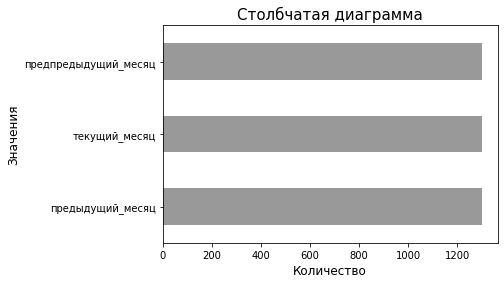

                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------


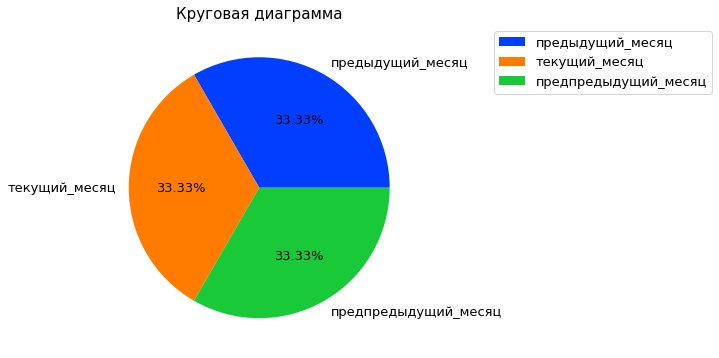

                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------


In [63]:
# создаём переменную, сожержащую только категориальные столбцы
market_money_cat = market_money[market_money.select_dtypes(exclude='number').columns]

# применяем функцию для визуализации категориальных признаков
print('Исследовательский анализ категориальных данных market_money\n')
for i in market_money_cat:
    print(f'Столбец "{i}"')
    cat_func(market_money_cat[i])
    plt.show()

**Промежуточные выводы датафрейма market_money:**

**Числовые признаки**

- `выручка:` распределение похоже на нормальное. Большинство наблюдений расположены в промежутке 4500-5500. С локальными незначительными пиками. Среднее - 5007.28, Медиана - 4959.00, Min - 2758.7, Max - 7799.4.

**Категориальные признаки**

- `период:` - наблдения распределены поровну, по 1300 (33.33%) между: предыдущий_месяц, текущий_месяц, предпредыдущий_месяц;

### Исследовательский анализ `market_time`

In [64]:
# выведем на экран типы данных market_time
print(f'Типы данных "market_time":\n{market_time.dtypes}')

Типы данных "market_time":
id         int64
период    object
минут      int64
dtype: object


**Числовые признаки**

Исследовательский анализ числовых данных market_time

Столбец "минут"


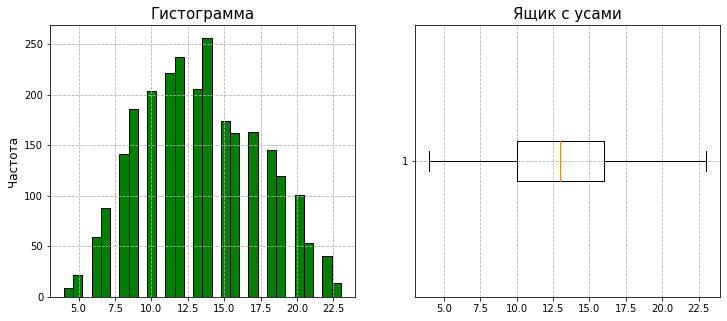

Описательная статистика:
count    2600.000000
mean       13.336154
std         4.080198
min         4.000000
25%        10.000000
50%        13.000000
75%        16.000000
max        23.000000
Name: минут, dtype: float64
                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------


In [65]:
# создаём переменную, сожержащую только числовые столбцы market_time (без id)
market_time_num = market_time[market_time.select_dtypes(include='number').columns].drop(['id'], axis=1)

# применяем функцию hist
print('Исследовательский анализ числовых данных market_time\n')
for i in market_time_num:
    print(f'Столбец "{i}"')
    hist(market_time_num[i])
    plt.show()

**Категориальные признаки**

Исследовательский анализ категориальных данных market_time

Столбец "период"

предыдущий_месяц    1300
текущий_месяц       1300
Name: период, dtype: int64


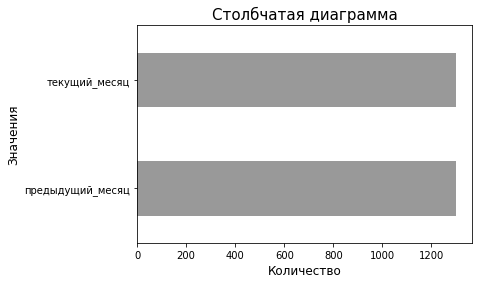

                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------


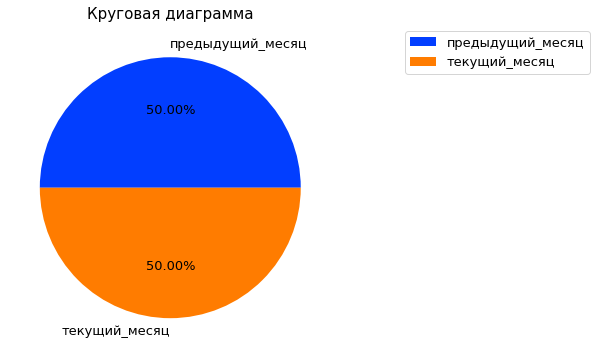

                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------


In [66]:
# создаём переменную, сожержащую только категориальные столбцы
market_time_cat = market_time[market_time.select_dtypes(exclude='number').columns]

# применяем функцию для визуализации категориальных признаков
print('Исследовательский анализ категориальных данных market_time\n')
for i in market_time_cat:
    print(f'Столбец "{i}"')
    cat_func(market_time_cat[i])
    plt.show()

**Промежуточные выводы датафрейма market_time:**

**Числовые признаки**

- `минут:` распределение похоже на нормальное. Среднее - 13.34, Медиана - 13.0, Min - 4.0, Max - 23.0.


**Категориальные признаки**

- `период:` - наблдения распределены пополам, по 1300 (50%) между: предыдущий_месяц, текущий_месяц;

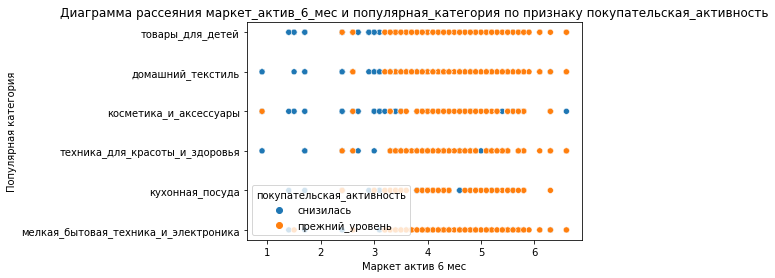

In [67]:
sns.scatterplot(data=market_file, x='маркет_актив_6_мес', y='популярная_категория', hue='покупательская_активность');
plt.title('Диаграмма рассеяния маркет_актив_6_мес и популярная_категория по признаку покупательская_активность');
plt.xlabel('Маркет актив 6 мес');
plt.ylabel('Популярная категория');

Не существует прямой, вдоль которой лежали бы все эти точки. Так выглядит отсутствие линейной зависимости между целевым и входным признаками

### Исследовательский анализ `money`

In [68]:
# выведем на экран типы данных money
print(f'Типы данных "money":\n{money.dtypes}')

Типы данных "money":
id           int64
прибыль    float64
dtype: object


Столбцы с категориальными значениями отсутствуют, поэтому рассматривать будем только числовые.

**Числовые признаки**

Исследовательский анализ числовых данных money

Столбец "прибыль"


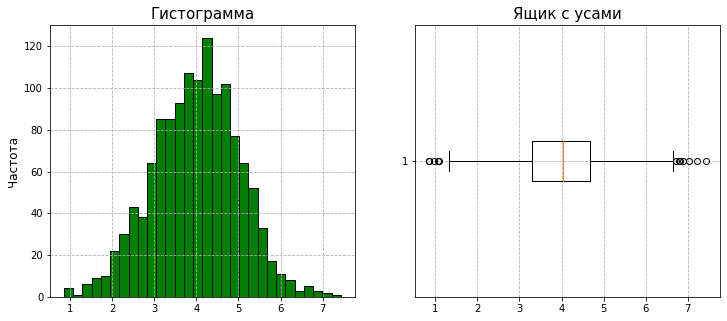

Описательная статистика:
count    1300.000000
mean        3.996631
std         1.013722
min         0.860000
25%         3.300000
50%         4.045000
75%         4.670000
max         7.430000
Name: прибыль, dtype: float64
                                                                                                  
                                                                                                  
--------------------------------------------------------------------------------------------------


In [69]:
# создаём переменную, сожержащую только числовые столбцы market_money (без id)
money_num = money[money.select_dtypes(include='number').columns].drop(['id'], axis=1)

# применяем функцию hist
print('Исследовательский анализ числовых данных money\n')
for i in money_num:
    print(f'Столбец "{i}"')
    hist(money_num[i])
    plt.show()


<div class="alert alert-warning">
<font size="5"><b>Комментарий ревьюера</b></font>



Совет:

    
- для гистограмм по выручке и минутам, стоит предварительно сделать группировку по "период" (у нас будет 3 графика по выручке и 2 по минутам), это разумно, ведь именно в таком виде мы используем их    

**Промежуточные выводы датафрейма money:**

**Числовые признаки**

- `прибыль:` распределение похоже на нормальное. Среднее - 3.99, Медиана - 4.0, Min - 0.86, Max - 7.43.

**Категориальные признаки**

- столбцов с категориальными данными не имеет.

### Отберём клиентов с покупательской активностью не менее трёх месяцев

Для отбора клиентов с покупательской активностью не менее трёх месяцев необходимо использовать данные из датафрейма market_money, содержащего информацию о выручке.

В столбце `выручка` нам известны траты клиентов за текущий месяц и за два предшествующих. Нам необходимо отобрать клиентов с покупательской активностью не менее трёх месяцев.

In [70]:
# создадим переменную с номерами id клиентов, которые не совершали покупок в каком-либо месяце,
not_active_client = market_money.loc[(market_money['выручка'] == 0)]['id'].unique()
print(f'id клиентов с нерегулярными покупками: {not_active_client}')

# создадим переменную с клиентами, которые совершали покупки в каждом из последних трёх месяцев
active_clients_three_months = market_money[market_money.id.isin(not_active_client) == False]

# выведем на экран количество строк со всеми клиентами и после отсеивания
print('Всего строк в датафрейме market_money:', len(market_money))
print('Строк после отсеивания клиентов с нерегулярными покупками:', len(active_clients_three_months))

# создадим переменную с клиентами, которые не совершали покупки в каждом из последних трёх месяцев
no_active_clients_three_months = market_money[market_money.id.isin(not_active_client) == True]

# выведем на экран клиентов с нерегулярными покупками
print('\nПользователи с нерегулярными покупками:')
no_active_clients_three_months

id клиентов с нерегулярными покупками: [215348 215357 215359]
Всего строк в датафрейме market_money: 3900
Строк после отсеивания клиентов с нерегулярными покупками: 3891

Пользователи с нерегулярными покупками:


,id,период,выручка
0,215348,предпредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
27,215357,текущий_месяц,5986.3
28,215357,предпредыдущий_месяц,0.0
29,215357,предыдущий_месяц,0.0
33,215359,текущий_месяц,4735.0
34,215359,предыдущий_месяц,0.0
35,215359,предпредыдущий_месяц,0.0


In [71]:
print('Количество клиентов с регулярными покупками в течение последних трёх месяцев:', 
      active_clients_three_months['id'].nunique())

Количество клиентов с регулярными покупками в течение последних трёх месяцев: 1297


Как видим, есть пользователи, не совершающие покупки каждый месяц.

In [72]:
# убираем пользователей с нерегулярными покупками
market_money = market_money[market_money.id.isin(not_active_client) == False]

# проверяем
market_money['id'].nunique()

1297

Клиенты с регулярными покупками в течение последних трёх месяцев отсортированы.

Выше в гистограмме по столбцу `выручка` мы обнаружили выбросы 0.00 и 106862.2. В предыдущем коде клиентов с нулевой выручкой мы отсеяли. Давайте посмотрим на максимально значение столбца `выручка`

In [73]:
market_money['выручка'].describe()

count      3891.000000
mean       5033.718890
std        1768.471286
min        2758.700000
25%        4592.000000
50%        4959.000000
75%        5363.200000
max      106862.200000
Name: выручка, dtype: float64

Минимальное значение в столбце `выручка` с 0.0 изменилось на 2758.7, но максимальное значение осталось прежним 106862.20

In [74]:
# повторю код с номером клиента у которого был найден выброс
market_money.query('id == 215380')

,id,период,выручка
96,215380,предпредыдущий_месяц,5051.0
97,215380,предыдущий_месяц,6077.0
98,215380,текущий_месяц,106862.2


Сложно объяснить почему в предпредыдущем и предыдущий месяце покупки были совершены на 5051.0 и 6077.0, а в текущем в 21 раз больше на 106862.2. Явно пахнет аномалией, слишком резкий скачек. Предлаюгаю этого клиента удалить, чтоб его данные не влияли на дальнейший анализ.

In [75]:
# определяем id клиента с выбросом в выручке
id_to_delete = market_money[market_money['выручка'] == 106862.2]['id'].tolist()

# уляляем данные о всех периодах для выбранного клиента
market_money = market_money.query('id != @id_to_delete')

# проверяем
print('Количество клиентов с регулярными покупками в течение последних трёх месяцев:', market_money['id'].nunique())

Количество клиентов с регулярными покупками в течение последних трёх месяцев: 1296


**Промежуточный вывод по исследовательсвкому анализу данных:**


Проанализировали числовые и категориальные признаки датафреймах: `market_file, market_money, market_time, money`
* с помощью гистограмм изучили распределения числовых признаков и их типы
* с помощью диаграмм размаха проверили числовые признаки на наличие выбросов
* с помощью столбчатых и круговых диаграмм изучили категориальные признаки
---

**Анализ числовых признаков:**

**датафрейме market_file**

- `маркет_актив_6 мес:` распределение похоже на нормальное. С локальными незначительными пиками. Среднее - 4.25, Медиана - 4,20, Min - 0,9, Max - 6,60;
- `маркет_актив_тек_мес:` распределение мультимодальное. Наблюдаем три пика: 3.0, 4.0 и 5.0. Среднее - 4.01, Медиана - 4.00, Min - 3.0, Max - 5.00;
- `длительность:` распределение стремится к нормальному. Самый "свежий" пользователь зарегистрировался 110 дней назад. Есть небольшие локальные пики на 200, 500, 800 и около 1000. Среднее - 601.90, Медиана - 606.00, Min - 110.0, Max - 1079.00;
- `акционные_покупки:` распределение бимодальное. Есть часть покупателей, которая за рассматриваемый период имеет долю покупок, совершённых по акции, близкую к единице. Среднее - 0.32, Медиана - 0.24, Min - 0.0, Max - 0.99;
- `средний_просмотр_категорий_за_визит:` распределение похоже на нормальное. Среднее - 3.27, Медиана - 3.00, Min - 1.0, Max - 6.00;

- `неоплаченные_продукты_штук_квартал:` распределение похоже на нормальное, но скошенное. Среднее - 2.84, Медиана - 3.00, Min - 0.0, Max - 10.00;
- `ошибка_сервиса:` распределение нормальное. Среднее - 4.19, Медиана - 4.00, Min - 0.0, Max - 9.00;
- `страниц_за_визит:` распределение нормальное. Среднее - 8.18, Медиана - 8.00, Min - 1.0, Max - 20.00.

**market_money:**

- `выручка:` распределение похоже на нормальное. Большинство наблюдений расположены в промежутке 4500-5500. С локальными незначительными пиками. Среднее - 5007.28, Медиана - 4959.00, Min - 2758.7, Max - 7799.4.

**market_time**

- `минут:` распределение похоже на нормальное. Среднее - 13.34, Медиана - 13.0, Min - 4.0, Max - 23.0.

**money**

- `прибыль:` распределение похоже на нормальное. Среднее - 3.99, Медиана - 4.0, Min - 0.86, Max - 7.43.
---

**Анализ категориальных признаков**

**датафрейме market_file**

- `покупательская_активность:` 802 пользователя имеюют прежний_уровень (61.69%), 498 пользователей активность снизилась (38.31%);
- `тип_сервиса:` 924 раза встречается стандарт (71.08%), остальные наблюдения - премиум 376 раз (28.92%);
- `разрешить_сообщать:` 962 раза встречается да (74.00%), остальные наблюдения - 338 раз (26.00%);
- `популярная_категория:` 330 наблюдений - Товары для детей (25.38%), 251 наблюдений - Домашний текстиль (19.31%), 223 наблюдений - Косметика и аксессуары (17.15%), 184 наблюдений - Техника для красоты и здоровья (14,15%), 174 наблюдений - Мелкая бытовая техника и электроника (13,38%), 138 наблюдений - Кухонная посуда (10,62%).  

**market_money:**

- `период:` - наблдения распределены поровну, по 1300 (33.33%) между: предыдущий_месяц, текущий_месяц, предпредыдущий_месяц;

**market_time**

- `период:` - наблдения распределены пополам, по 1300 (50%) между: предыдущий_месяц, текущий_месяц;

**money**

- столбцов с категориальными данными не имеет.
---
Отобрали клиентов с регулярными покупками в течение последних трёх месяцев: **1296**

## Шаг 4. Объединение таблиц

Объединим датафреймы market_file, market_money и market_time.

Учитывая, что данные о выручке и времени на сайте находятся в одном столбце для всех периодов, в итоговой таблице для каждого периода сделаем отдельный столбец.

Перед объединением таблиц преобразуем признак покупательская_активность в датафрейме market_file - изменим категориальные значения Снизилась и Прежний уровень на 1 и 0.

In [76]:
# функция для преобразования категориального признака с двумя значениями в числовой бинарный признак
def to_binary_func(value):
    '''
    Принимает отдельный столбец из фрейма данных, содержащий категориальные значения.
    Предварительно необходимо задать переменные: 
    cat_value_one (будет преобразовано в 1), 
    cat_value_two (будет преобразовано в 0), 
    и сохранить в них категориальные значения исходного pandas.Series.
    
    Args:
        value (pandas.core.series.Series) - переменная с категориальными значениями

    Returns:
        Столбец с преобразованными значениями (0, 1)
    '''  
    try:
        if value == cat_value_one:
            return 1
        elif value == cat_value_two:
            return 0
    except:
        return 'Error'

In [77]:
market_file['покупательская_активность'].unique()

array(['снизилась', 'прежний_уровень'], dtype=object)

In [78]:
# создадим функцию преобразуем категориальные значения 'покупательская_активность' в числовые
# 'Снизилась' = 1
# 'Прежний уровень' = 0

# зададим переменные для преобразования
cat_value_one = 'снизилась'
cat_value_two = 'прежний_уровень'

# перезапишем столбец 'покупательская_активность' с помощью функции to_binary_func
market_file['покупательская_активность'] = market_file['покупательская_активность'].apply(to_binary_func)

# проверяем
print(market_file['покупательская_активность'].value_counts())
market_file.head()

0    802
1    498
Name: покупательская_активность, dtype: int64


,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
0,215348,1,премиум,да,3.4,5,121,0.00,товары_для_детей,6,2,1,5
1,215349,1,премиум,да,4.4,4,819,0.75,товары_для_детей,4,4,2,5
2,215350,1,стандарт,нет,4.9,3,539,0.14,домашний_текстиль,5,2,1,5
3,215351,1,стандарт,да,3.2,5,896,0.99,товары_для_детей,5,0,6,4
4,215352,1,стандарт,нет,5.1,3,1064,0.94,товары_для_детей,3,2,3,2


Преобразование прошло корректно.

Объединяем таблицы

In [79]:
# выделим из market_money и market_time отдельные датарфеймы для каждого периода
market_money_tek_mes = (market_money
                        .query('период == "текущий_месяц"')
                        .drop(['период'], axis=1)
                        .rename(columns={'выручка': 'выручка_текущий_месяц'}))

market_money_pre_mes = (market_money
                        .query('период == "предыдущий_месяц"')
                        .drop(['период'], axis=1)
                        .rename(columns={'выручка': 'выручка_предыдущий_месяц'}))

market_money_prepre_mes = (market_money
                           .query('период == "предпредыдущий_месяц"')
                           .drop(['период'], axis=1)
                           .rename(columns={'выручка': 'выручка_предпредыдущий_месяц'}))

market_time_tek_mes = (market_time
                       .query('период == "текущий_месяц"')
                       .drop(['период'], axis=1)
                       .rename(columns={'минут': 'минут_текущий_месяц'}))

market_time_pre_mes = (market_time
                       .query('период == "предыдущий_месяц"')
                       .drop(['период'], axis=1)
                       .rename(columns={'минут': 'минут_предыдущий_месяц'}))

In [80]:
# объединяем датафреймы
merged_final = (market_file
                .merge(market_money_tek_mes, on='id')
                .merge(market_money_pre_mes, on='id')
                .merge(market_money_prepre_mes, on='id')
                .merge(market_time_tek_mes, on='id')
                .merge(market_time_pre_mes, on='id')
                .reset_index(drop=True))

# проверяем
print(merged_final.shape)
merged_final.head()

(1296, 18)


,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_текущий_месяц,выручка_предыдущий_месяц,выручка_предпредыдущий_месяц,минут_текущий_месяц,минут_предыдущий_месяц
0,215349,1,премиум,да,4.4,4,819,0.75,товары_для_детей,4,4,2,5,4971.6,5216.0,4472.0,10,12
1,215350,1,стандарт,нет,4.9,3,539,0.14,домашний_текстиль,5,2,1,5,5058.4,5457.5,4826.0,13,8
2,215351,1,стандарт,да,3.2,5,896,0.99,товары_для_детей,5,0,6,4,6610.4,6158.0,4793.0,13,11
3,215352,1,стандарт,нет,5.1,3,1064,0.94,товары_для_детей,3,2,3,2,5872.5,5807.5,4594.0,11,8
4,215353,1,стандарт,да,3.3,4,762,0.26,домашний_текстиль,4,1,1,4,5388.5,4738.5,5124.0,10,10


**Промежуточный вывод по объединению таблиц:**

* В датафрейме `df_market_file` в столбце `покупательская_активность` категориальные значения `Снизилась` и `Прежний уровень` изменили на `1` и `0`;
* Объединили датафреймы `df_market_file`, `df_market_money` и `df_market_time` и сохранили в переменную `df_merged_final`;
* В итоговой таблице для каждого периода из `df_market_money` и `df_market_time` сделали отдельный столбец;
* Объединённый датафрейм содержит: 1296 строк и 18 столбцов

## Шаг 5. Корреляционный анализ

* Проведите корреляционный анализ признаков в количественной шкале в итоговой таблице для моделирования. 
* Сделайте выводы о мультиколлинеарности и при необходимости устраните её.

Выше в разделе при исследовательском анализе мы определили распределение количественных признаков:
**`df_market_file`** 

- маркет_актив_6 мес - нормальное
- маркет_актив_тек_мес - ненормальное, мультимодальное
- длительность - нормальное
- акционные_покупки - ненормальное, бимодальное
- средний_просмотр_категорий_за_визит - нормальное
- неоплаченные_продукты_штук_квартал - нормальное
- ошибка_сервиса - нормальное
- страниц_за_визит - нормальное
    
    
**`df_market_money`**    
- выручка - нормальное


**`df_market_time`**    
- минут - нормальное

Столбцы с категориальными данными:
- покупательская_активность
- тип_сервиса
- разрешить_сообщать
- популярная_категория

Используем библиотеку **phik** для подсчёта корреляции между признаками разных типов данных.

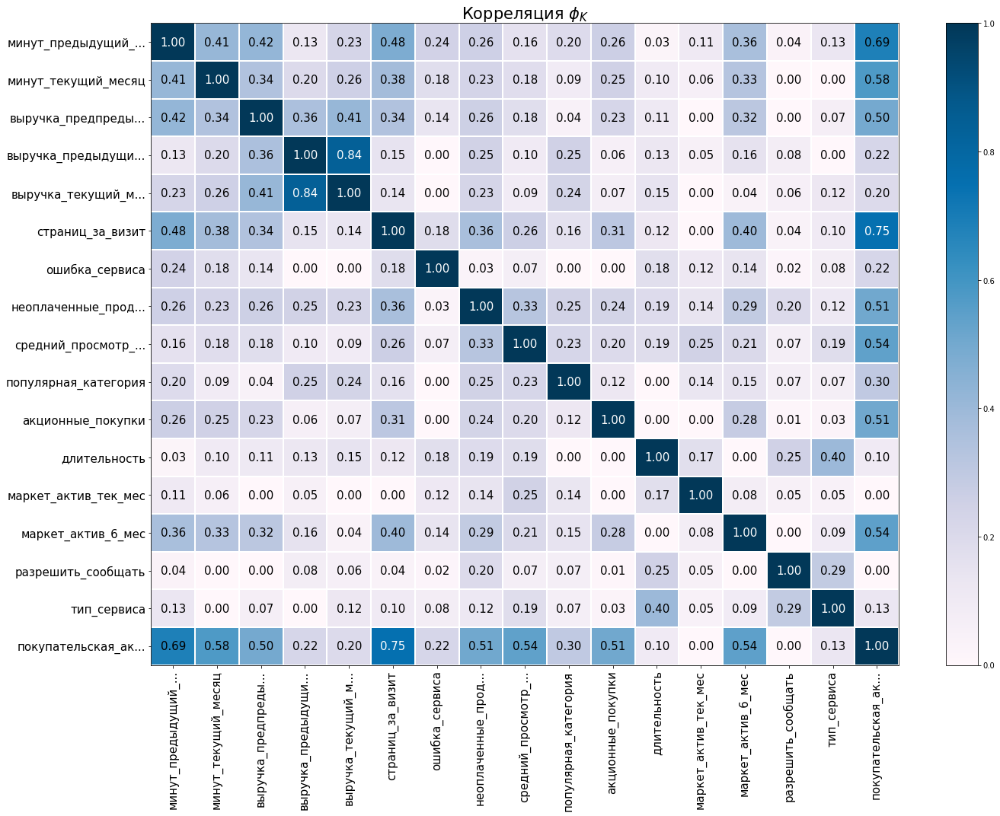

In [81]:
# строим матрицу корреляции
phik_overview = (
    merged_final
    .drop('id', axis=1)
    .phik_matrix(verbose=False))

# визуализируем матрицу и выводим на экран
plot_correlation_matrix(
    phik_overview.values,
    x_labels=phik_overview.columns,
    y_labels=phik_overview.index,
    vmin=0, vmax=1, color_map='PuBu',
    title=r'Корреляция $\phi_K$',
    fontsize_factor=1.5,
    figsize=(20, 15)
)

In [82]:
print('Признаки для матрицы корреляции:\n')
merged_final.info()

Признаки для матрицы корреляции:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296 entries, 0 to 1295
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   1296 non-null   int64  
 1   покупательская_активность            1296 non-null   int64  
 2   тип_сервиса                          1296 non-null   object 
 3   разрешить_сообщать                   1296 non-null   object 
 4   маркет_актив_6_мес                   1296 non-null   float64
 5   маркет_актив_тек_мес                 1296 non-null   int64  
 6   длительность                         1296 non-null   int64  
 7   акционные_покупки                    1296 non-null   float64
 8   популярная_категория                 1296 non-null   object 
 9   средний_просмотр_категорий_за_визит  1296 non-null   int64  
 10  неоплаченные_продукты_штук_квартал   1296 non-null   int64  
 

**Промежуточный вывод по корреляционному анализу данных:**

Целевой признак столбец `покупательская_активность`, остальные столбцы входные.
Рассмотрим корреляционные взаимосвязи:

* тип_сервиса - 0.13, слабая, практически отсутствует
* разрешить_сообщать - 0.00, отсутствует
* маркет_актив_6 мес - 0.54, заметная
* маркет_актив_тек_мес - 0.00, отсутствует
* длительность - 0.10, слабая, практически отсутствует
* акционные_покупки - 0.51, заметная
* популярная_категория - 0.30, умеренная
* средний_просмотр_категорий_за_визит - 0.54, заметная
* неоплаченные_продукты_штук_квартал - 0.51, заметная
* ошибка_сервиса - 0.22, слабая
* страниц_за_визит - 0.75, высокая, заметная относительно других
* выручка_текущий_месяц - 0.20, слабая
* выручка_предыдущий_месяц - 0.22, слабая
* выручка_предпредыдущий_месяц - 0.50, заметная
* минут_текущий_месяц - 0.58, заметная
* минут_предыдущий_месяц - 0.69, заметная

Мультиколлинеарность отсутствует, так как коэффициент корреляции от 0.9 до 0.95 по модулю. 

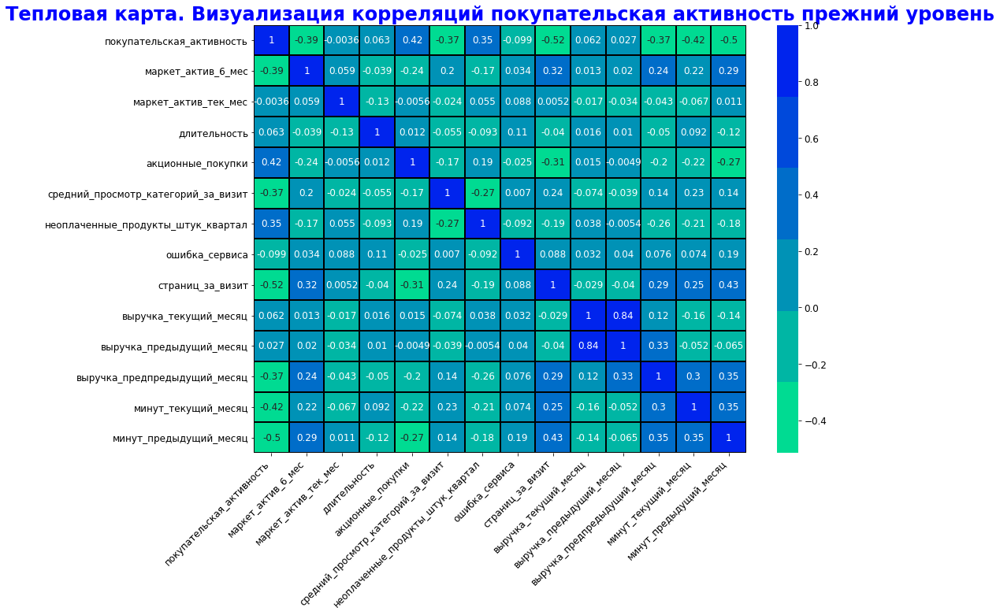

In [83]:
df = merged_final[merged_final['покупательская_активность'] == 0]

plt.figure(figsize=(14,10))
colormap = sns.color_palette("winter_r")
plt.rc('font', size= 12) 
chart = sns.heatmap(merged_final[merged_final.columns[df.columns != 'id']].corr(), annot=True, cmap=colormap, linewidths=1, linecolor='black')
plt.title('Тепловая карта. Визуализация корреляций покупательская активность прежний уровень', fontsize=24, fontweight="bold", color='blue') 
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

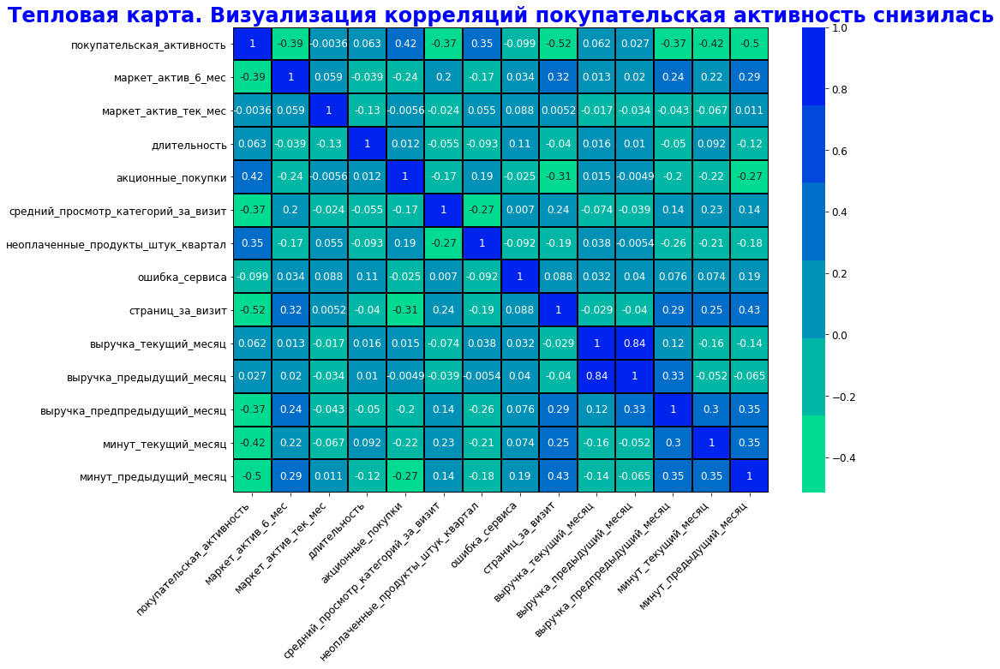

In [84]:
df = merged_final[merged_final['покупательская_активность'] == 1]

plt.figure(figsize=(14,10))
colormap = sns.color_palette("winter_r")
plt.rc('font', size= 12) 
chart = sns.heatmap(merged_final[df.columns[merged_final.columns != 'id']].corr(), annot=True, cmap=colormap, linewidths=1, linecolor='black')
plt.title('Тепловая карта. Визуализация корреляций покупательская активность снизилась', fontsize=24, fontweight="bold", color='blue') 
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

По ощущениям на тепловой карте как будто изменений нет, Марат, видимо я что то неправильно построила?



<div class="alert alert-warning">
<font size="5"><b>Комментарий ревьюера</b></font>

Совет 🤔:






В прошлом проекте мы активно использовали scatter_plot для уточнения характера связи между признаками и удоем, и на основе увиденного сделали некоторые преобразования, помогающие преодолеть ограничения линейной модели. В этом проекте мы используем нелинейные модели для которых это не проблема, и таргет у нас не количественный а категориальный. Тем не менее и в этом проекте можно построить scatter_plot между количественными признаками, а таргет использовать  в качестве фильтра. Напомню что проще всего это реализовать с помощью [sns.PairGrid](https://seaborn.pydata.org/generated/seaborn.PairGrid.html). Это не пригодится нам для улучшения метрики, но возможно мы увидим что то полезное для сегментации или лучшего понимания наших данных. 

- Можно c помощью scatter_plot сконцентрироваться на связи между выручка текущая - выручка за прошлый. Там явная линейная зависимость, причем как будто бы множество точек тяготеют к двум прямым. Можно поискать факторы которые описывает эти два разных множества. Можно к выручке за прошлый месяц добавить выручку за позапрошлый месяц (или отнять) и тогда в каких то группировках по категориальным признакам будет очень четкая линейная зависимость достигающая по r2 за 0.9. Из этого можно сделать вывод что  в определенных группировках, зависимость между выручками за разные периоды практически дерерминирована (очень высокий показатель r2), то есть из выручки за прошлый (и с учетом позапрошлого месяца) мы можем точно спрогнозировать расходы клиента за текущий месяц. О чем это может говорить? 



- Можно посмотреть scatter_plot между id и акционными покупками. Можно кое что интересное увидеть и дать этому обьяснение


## Шаг 6. Использование пайплайнов

Проверка дисбаланса классов

Соотношение классов признака "покупательская_активность" (в %):
0    0.62
1    0.38
Name: покупательская_активность, dtype: float64


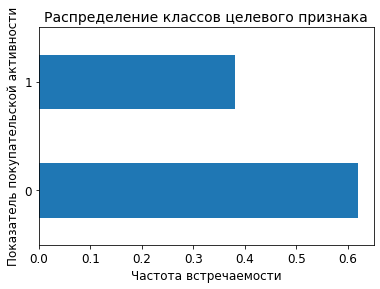

In [85]:
# проверяем целевой признак на дисбаланс классов
print('Соотношение классов признака "покупательская_активность" (в %):')
print(round(merged_final.покупательская_активность.value_counts(normalize=True), 2))

# визуализируем на графике
merged_final.покупательская_активность.value_counts(normalize=True).plot(kind='barh')
plt.title('Распределение классов целевого признака', size=14)
plt.xlabel('Частота встречаемости', size=12)
plt.ylabel('Показатель покупательской активности', size=12)
plt.xticks(rotation=0);

Соотношение классов в целевом признаке непропорционально - 62% (прежний уровень, класс 0) против 38% (снизилась, класс 1).
Поэтому, чтобы сохранить пропорцию классов в тренировочной и тестовой выборках, используем стратификацию.

Разделение данных на выборки с учётом стратификации по целевому признаку

 

<div class="alert alert-warning">
<font size="5"><b>Комментарий ревьюера</b></font>

Совет: 

    
    RANDOM_STATE = 42
    TEST_SIZE = 0.25    
    
- Это обычно оставляет после импортов     
    
    
    
- Вообще такого рода графики лучше оставить в  разделе исследования    
    
    
- Не надо путать стратификацию и дисбаланс. Со stratify мы убираем риски получения очень сильно отличающихся датасетов по пропорциям единичек и нулей. Глянь долю снизилось в таргетах для train и test со стратификацией, они будут одинаковыми 0,38, это и есть результат стратификации. Но дисбаланс то всё равно сохранятся. И наоборот   даже если у нас нулей и единичек поровну всё равно стоит использовать стратификацию,  потому что в случае сплита без стратификации пропорции в тренировочной или тестовой выборке могут измениться. А для некоторых моделей это может стать проблемой.  А вот как работать с дисбалансом - это например провести перебалансировку тренировочный выборки,  или при инициализации модели использовать class_weihgt,  чтобы за ошибку на минорном в классе функция ошибки штрафовалась сильнее. Ты можешь погуглить информацию, а я хочу предложить две ссылки,  о некоторых деталях при работе c дисбалансом (Так и страшно дисбаланс)[https://habr.com/ru/articles/349078/] , (перебалансировка без утечки данных)[https://datascience.xyz/practice/kak-delat-kross-validaciju-pri-apsemplinge-dannyh.html]

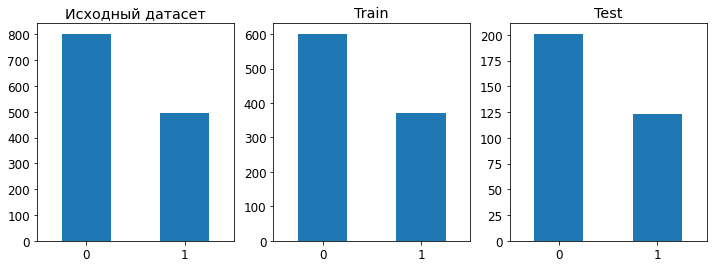

In [86]:
RANDOM_STATE = 42
TEST_SIZE = 0.25

# выделяем в отдельные переменные целевой признак и входные признаки
X = merged_final.drop(columns=['покупательская_активность', 'id'])
y = merged_final['покупательская_активность']

# разбиваем данные на выборки с учётом стратификации по целевому признаку
X_train, X_test, y_train, y_test = train_test_split(
    X, 
    y, 
    random_state=RANDOM_STATE, 
    test_size=TEST_SIZE, 
    stratify=y
) 

# визуализируем баланс целевого признака в выборках
fig, ax = plt.subplots(1,3, figsize=(12,4))
y.value_counts().plot(kind='bar', ax=ax[0], rot=0)
ax[0].set_title("Исходный датасет")
y_train.value_counts().plot(kind='bar', ax=ax[1], rot=0)
ax[1].set_title("Train")
y_test.value_counts().plot(kind='bar', ax=ax[2], rot=0)
ax[2].set_title("Test")
plt.show()

Сначала обозначим, какие данные требуют масштабирования, а какие - кодирования. Признаки кодируем разными методами. Введём обозначения для типов исходных данных:

Создаем пайплайн для поиска лучшей модели из изученных

* **`DecisionTreeClassifier()`** с гиперпараметрами:
    * max_depth от 2 до 4 включительно
    * max_features от 2 до 4 включительно


* **`KNeighborsClassifier()`** с гиперпараметром:
    * n_neighbors от 2 до 4 включительно


* **`LogisticRegression()`**:
    * с решателем `solver='liblinear'` и лассо-регуляризацией с гиперпараметром:
    * С от 1 до 4 включительно


* **`SVC()`**:
    * с линейным ядром `kernel='linear'` с гиперпараметром:
   

После выбора лучшей модели рассчитаем метрику `ROC-AUC` на тренировочной и тестовой выборках.  
Выбираем именно `ROC-AUC`, так как данная метрика лучше всего подойдёт для задачи бинарной классификации с несбалансированным целевым признаком.

In [87]:
# создаём списки с названиями признаков для кодирования и масштабирования/стандартизации
# признаки для кодирования OneHotEncoder
ohe_columns = ['популярная_категория']

# признаки для кодирования OrdinalEncoder
ord_columns = ['тип_сервиса', 'разрешить_сообщать']

# признаки для масштабирования/стандартизации
num_columns = ['маркет_актив_6_мес', 
               'маркет_актив_тек_мес', 
               'длительность', 
               'акционные_покупки', 
               'средний_просмотр_категорий_за_визит', 
               'неоплаченные_продукты_штук_квартал', 
               'ошибка_сервиса', 
               'страниц_за_визит', 
               'выручка_текущий_месяц', 
               'выручка_предыдущий_месяц', 
               'выручка_предпредыдущий_месяц', 
               'минут_текущий_месяц', 
               'минут_предыдущий_месяц']

# создаём пайплайн для подготовки признаков из списка ohe_columns: заполнение пропусков и OHE-кодирование
# SimpleImputer + OHE
ohe_pipe = Pipeline([('ohe', OneHotEncoder(drop='first', handle_unknown='error', sparse_output=False))])

# создаём пайплайн для подготовки признаков из списка ord_columns: заполнение пропусков и Ordinal-кодирование
# SimpleImputer + OE
ord_pipe = Pipeline(
    [('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ord',  OrdinalEncoder(
                categories=[
                    ['стандарт', 'премиум'], 
                    ['да', 'нет']
                ], 
                handle_unknown='use_encoded_value', unknown_value=np.nan
            )
        ),
     ('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))
    ]
)

# создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [('ohe', ohe_pipe, ohe_columns),
     ('ord', ord_pipe, ord_columns),
     ('num', MinMaxScaler(), num_columns)
    ], 
    remainder='passthrough'
)

# создаём итоговый пайплайн: подготовка данных и модель
pipe_final = Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', DecisionTreeClassifier(random_state=RANDOM_STATE))
])


param_grid = [
    # словарь для модели KNeighborsClassifier() 
    {
        # название модели
        'models': [KNeighborsClassifier()],
        # указываем гиперпараметр модели n_neighbors
        'models__n_neighbors': range(2, 5),
        # указываем список методов масштабирования
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler()]   
    },
    # словарь для модели DecisionTreeClassifier()
    {
        'models': [DecisionTreeClassifier(random_state=RANDOM_STATE)],
        'models__max_depth': range(2, 5),
        'models__max_features': range(2, 5),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']  
    },
    # словарь для модели SVC()
    {
        'models': [SVC(random_state=RANDOM_STATE, probability=True)],
        'models__C': range(1, 5),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']  

    },
    # словарь для модели LogisticRegression()
    {
    'models': [LogisticRegression(
        random_state=RANDOM_STATE, 

    )],
    'models__C': range(1, 15),
    'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']  
    }
]

# выберем лучшую модель и параметры с помощью RandomizedSearchCV()
# количество комбинаций гиперпараметров поставим 5
randomized_search = RandomizedSearchCV(
    pipe_final, 
    param_grid, 
    cv=5,
    scoring='roc_auc',
    n_iter=5,
    random_state=RANDOM_STATE,
    n_jobs=-1
)
# обучаем лучшую модель на тренировочных данных
randomized_search.fit(X_train, y_train)

# выводим на экран лучшую модель, её параметры и метрику ROC-AUC на тренировочной выборке
print('Лучшая модель и её параметры:\n\n', randomized_search.best_estimator_)
print('--------------------------------------------------------------------------------------------------')
print(f'Параметры лучшей модели:\n{randomized_search.best_params_}')
print('--------------------------------------------------------------------------------------------------')
print('Метрика лучшей модели на Кросс валидационной выборке:', round(randomized_search.best_score_, 3))
print('--------------------------------------------------------------------------------------------------')



# проверяем работу модели на тестовой выборке
y_test_pred = randomized_search.predict_proba(X_test)[:, 1]

print(f'Метрика ROC-AUC на тестовой выборке: {round(roc_auc_score(y_test, y_test_pred), 3)}')

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 sparse_output=False))]),
                                                  ['популярная_категория']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ord',
                                                                   OrdinalEncoder(categories=[['стандарт',
                        

In [88]:
# преобразовываем результаты в датафрейм и выводим результаты на экран
pd.DataFrame(randomized_search.cv_results_)[
    ['std_test_score', 'rank_test_score', 'param_models', 'mean_test_score','params']
].sort_values('rank_test_score')

,std_test_score,rank_test_score,param_models,mean_test_score,params
0,0.018290,1,"SVC(probability=True, random_state=42)",0.897820,"{'preprocessor__num': MinMaxScaler(), 'models_..."
3,0.017346,2,LogisticRegression(random_state=42),0.897560,"{'preprocessor__num': MinMaxScaler(), 'models_..."
2,0.016705,3,LogisticRegression(random_state=42),0.897314,"{'preprocessor__num': MinMaxScaler(), 'models_..."
4,0.011744,4,KNeighborsClassifier(),0.863675,"{'preprocessor__num': StandardScaler(), 'model..."
1,0.042235,5,DecisionTreeClassifier(random_state=42),0.785589,"{'preprocessor__num': MinMaxScaler(), 'models_..."


**Промежуточный вывод по использованию пайплайнов:**

Построили пайплайн и выбрали лучшую комбинацию модели и гиперпараметров с использованием *четырёх* моделей:
* DecisionTreeClassifier()
* KNeighborsClassifier()
* LogisticRegression()
* SVC()

---
Лучшая модель: 
* `'preprocessor__num': MinMaxScaler(), 'models__C': 2, 'models': SVC(probability=True, random_state=42)`

Метрика лучшей модели на Кросс валидационной выборке: 0.898

Метрика `ROC-AUC` лучшей модели на тестовой выборке: 0.913

---

## Шаг 7. Анализ важности признаков

Необходимо оценить важность признаков для лучшей модели и постройте график важности с помощью метода SHAP

По результатам предыдущего шага, мы выявили, по работе пайплайна, что лучшая модель `SVC(C=1, probability=True, random_state=42)`

Оценка значимости признаков при классификации отдельных наблюдений позволяют детальнее всего интерпретировать модель и даже понять, почему она ошиблась в каждом конкретном случае. Сформируем данные для постройки графиков.

In [89]:
# код ревьюера

# shap_values.shape

# а нам нужно 2 размерности, поэтому нужно было делать срез shap_values[:,:,1]

PermutationExplainer explainer: 325it [04:10,  1.26it/s]                         


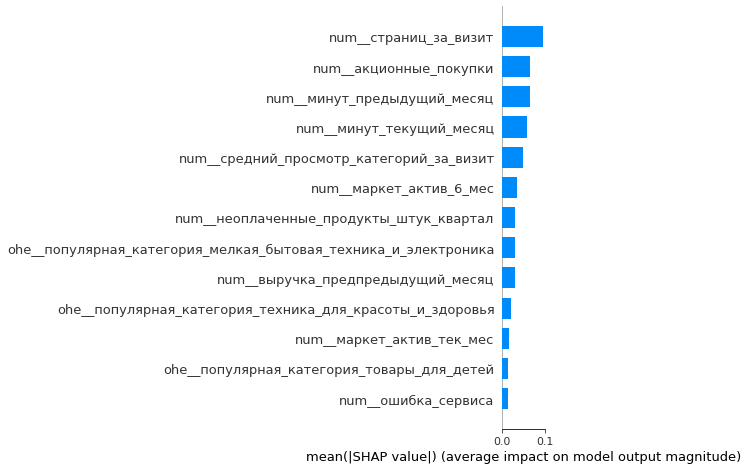

In [90]:
# код ревьюера

best_model = randomized_search.best_estimator_
svc_model = best_model.named_steps['models']

X_train = best_model.named_steps['preprocessor'].fit_transform(X_train)
X_test = best_model.named_steps['preprocessor'].transform(X_test)
explainer = shap.Explainer(svc_model.predict_proba, X_test)
shap_values = explainer(X_test)

feature_names = randomized_search.best_estimator_.named_steps['preprocessor'].get_feature_names_out()  
shap.summary_plot(shap_values[:,:,1], plot_type='bar', feature_names=feature_names, max_display=13)

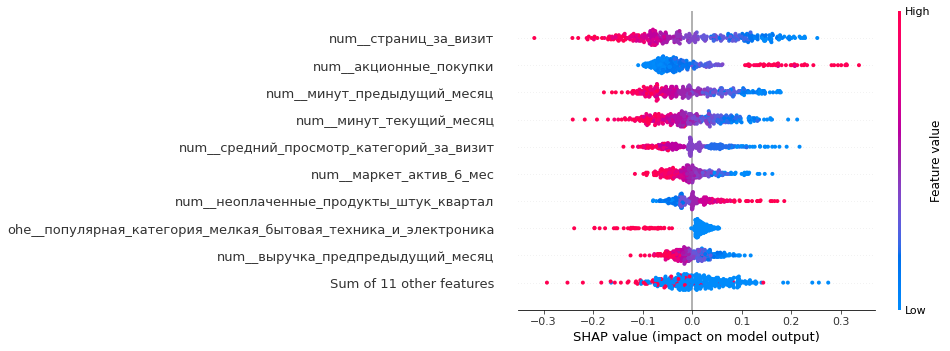

In [91]:
# код ревьюера
explanation = shap.Explanation(shap_values[:,:,1], data=X_test, feature_names=feature_names)
shap.plots.beeswarm(explanation)

Наибольшее влияние на целевой признак "Покупательская активность" оказывают акционные покупки, вероятно клиенты ищут товары по акции и стараются купить товар как можно выгоднее. Также влияют столбцы: предпредущий_время, средний просмотр категорий за визит, и текущий время. Думаю это можно объяснить поведением покупателя. Просто так на сайт заходить не будут, и если кто-то, что-то даже не хотел покупать, но увидит хорошую цену, то обязательно приобретет товар.

## Шаг 8. Сегментация покупателей

In [92]:
merged_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296 entries, 0 to 1295
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   1296 non-null   int64  
 1   покупательская_активность            1296 non-null   int64  
 2   тип_сервиса                          1296 non-null   object 
 3   разрешить_сообщать                   1296 non-null   object 
 4   маркет_актив_6_мес                   1296 non-null   float64
 5   маркет_актив_тек_мес                 1296 non-null   int64  
 6   длительность                         1296 non-null   int64  
 7   акционные_покупки                    1296 non-null   float64
 8   популярная_категория                 1296 non-null   object 
 9   средний_просмотр_категорий_за_визит  1296 non-null   int64  
 10  неоплаченные_продукты_штук_квартал   1296 non-null   int64  
 11  ошибка_сервиса                

In [93]:
merged_final['покупательская_активность'] = merged_final['покупательская_активность'].apply(lambda x: 1 if x == 1 else 0)
child_product = merged_final[merged_final['популярная_категория'] == 'товары_для_детей']
child_product.head()

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_текущий_месяц,выручка_предыдущий_месяц,выручка_предпредыдущий_месяц,минут_текущий_месяц,минут_предыдущий_месяц
0,215349,1,премиум,да,4.4,4,819,0.75,товары_для_детей,4,4,2,5,4971.6,5216.0,4472.0,10,12
2,215351,1,стандарт,да,3.2,5,896,0.99,товары_для_детей,5,0,6,4,6610.4,6158.0,4793.0,13,11
3,215352,1,стандарт,нет,5.1,3,1064,0.94,товары_для_детей,3,2,3,2,5872.5,5807.5,4594.0,11,8
6,215355,1,стандарт,нет,4.7,4,284,0.17,товары_для_детей,5,1,6,4,3772.6,3263.0,4749.0,10,12
12,215363,1,стандарт,нет,4.9,4,923,0.29,товары_для_детей,6,0,3,1,6128.3,6010.0,4633.0,5,8


In [94]:
child_product.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 329 entries, 0 to 1287
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   329 non-null    int64  
 1   покупательская_активность            329 non-null    int64  
 2   тип_сервиса                          329 non-null    object 
 3   разрешить_сообщать                   329 non-null    object 
 4   маркет_актив_6_мес                   329 non-null    float64
 5   маркет_актив_тек_мес                 329 non-null    int64  
 6   длительность                         329 non-null    int64  
 7   акционные_покупки                    329 non-null    float64
 8   популярная_категория                 329 non-null    object 
 9   средний_просмотр_категорий_за_визит  329 non-null    int64  
 10  неоплаченные_продукты_штук_квартал   329 non-null    int64  
 11  ошибка_сервиса                 

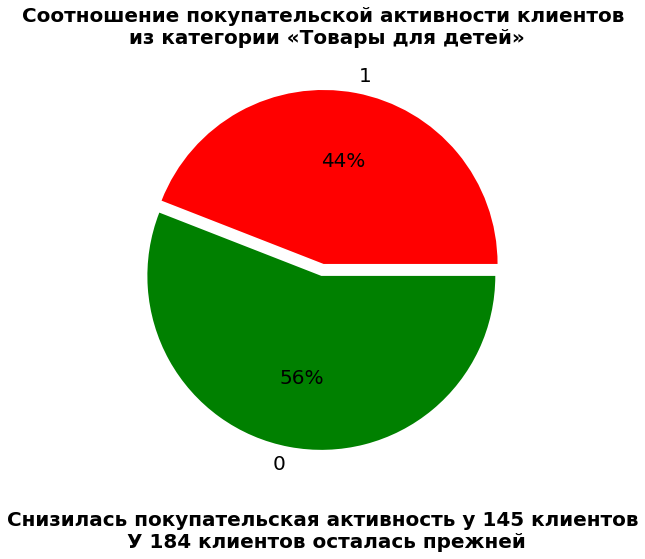

In [95]:
reduce = len(child_product[child_product['покупательская_активность']== 1])
norm = len(child_product[child_product['покупательская_активность']== 0])
data = [reduce, norm]
labels = [1, 0]
plt.figure(figsize=(8,8))
plt.rc('font', size= 20 ) 

fbcolor = ["red", "green"]

explode = [0.02, 0.05]

plt.pie(data, labels = labels, explode = explode, colors = fbcolor, autopct='%.0f%%', textprops={'color':"black"})
plt.title('Соотношение покупательской активности клиентов\n из категории «Товары для детей»', 
          fontsize=20, fontweight="bold", color='black')
plt.xlabel(f'\nСнизилась покупательская активность у {reduce} клиентов\n У {norm} клиентов осталась прежней', fontsize=20, fontweight="bold", color='black')
plt.show() 

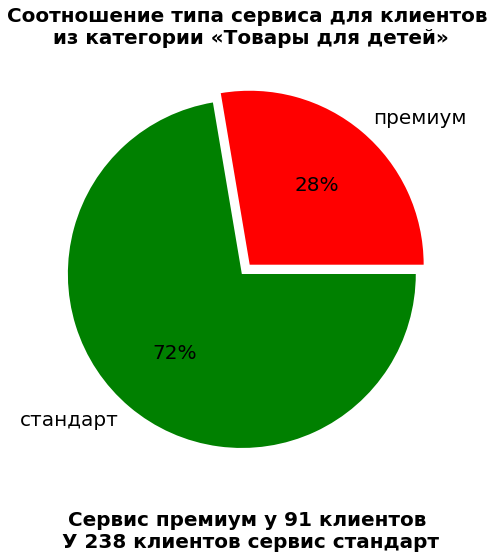

In [96]:
reduce = len(child_product[child_product['тип_сервиса']== 'премиум'])
norm = len(child_product[child_product['тип_сервиса']== 'стандарт'])
data = [reduce, norm]
labels = ['премиум', 'стандарт']
plt.figure(figsize=(8,8))
plt.rc('font', size= 20 ) 

fbcolor = ["red", "green"]

explode = [0.02, 0.05]

plt.pie(data, labels = labels, explode = explode, colors = fbcolor, autopct='%.0f%%', textprops={'color':"black"})
plt.title('Соотношение типа сервиса для клиентов\n из категории «Товары для детей»', 
          fontsize=20, fontweight="bold", color='black')
plt.xlabel(f'\nСервис премиум у {reduce} клиентов\n У {norm} клиентов сервис стандарт', fontsize=20, fontweight="bold", color='black')
plt.show() 

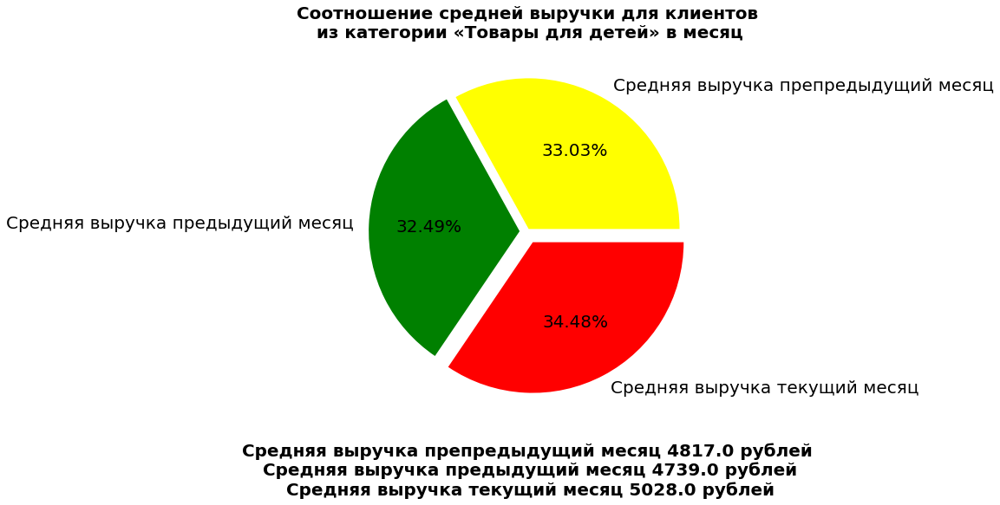

In [97]:
sum_month_1 = child_product['выручка_предпредыдущий_месяц'].mean()
sum_month_2 = child_product['выручка_предыдущий_месяц'].mean()
sum_month_3 = child_product['выручка_текущий_месяц'].mean()
data = [sum_month_1, sum_month_2, sum_month_3]
labels = ['Средняя выручка препредыдущий месяц', 'Средняя выручка предыдущий месяц', 'Средняя выручка текущий месяц']
plt.figure(figsize=(8,8))
plt.rc('font', size= 20 ) 

fbcolor = ["yellow", "green", "red"]

explode = [0.02, 0.05, 0.08]

plt.pie(data, labels = labels, explode = explode, colors = fbcolor, autopct='%.2f%%', textprops={'color':"black"})
plt.title('Соотношение средней выручки для клиентов\n из категории «Товары для детей» в месяц', 
          fontsize=20, fontweight="bold", color='black')
plt.xlabel(f'\nСредняя выручка препредыдущий месяц {round(sum_month_1,0)} рублей\n Средняя выручка предыдущий месяц {round(sum_month_2,0)} рублей\n Средняя выручка текущий месяц {round(sum_month_3,0)} рублей', fontsize=20, fontweight="bold", color='black')
plt.show() 

Видим рост выручки на протяжении 3 месяцев клиентов из категории «Товары для детей»

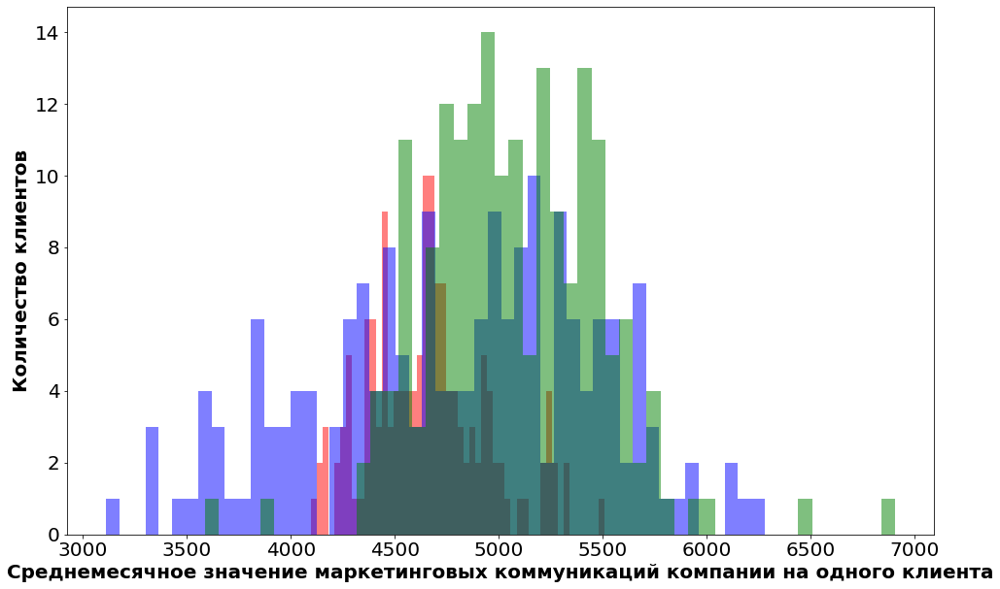

In [98]:
ax = child_product['выручка_предпредыдущий_месяц'][child_product['покупательская_активность'] == 1].plot(kind='hist', bins= 50, grid=False, color='red', figsize=(16,10), alpha=0.5)
ax = child_product['выручка_предыдущий_месяц'][child_product['покупательская_активность'] == 0].plot(kind='hist', bins= 50, grid=False, color='blue', figsize=(16,10), alpha=0.5)
ax = child_product['выручка_текущий_месяц'][child_product['покупательская_активность'] == 0].plot(kind='hist', bins= 50, grid=False, color='green', figsize=(16,10), alpha=0.5)
ax.set_xlabel('Cреднемесячное значение маркетинговых коммуникаций компании на одного клиента', fontsize=20, fontweight="bold", color='black')
ax.set_ylabel('Количество клиентов', fontsize=20, fontweight="bold", color='black')

None

Наибольшее количество клиентов из категории «Товары для детей» приносит прибыль от 4000 до 5700 рублей в месяц.

/tmp/ipykernel_121/2913117858.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  child_product['покупательская_активность'] = child_product['покупательская_активность'].apply(lambda x: 1 if x == 1 else 0)


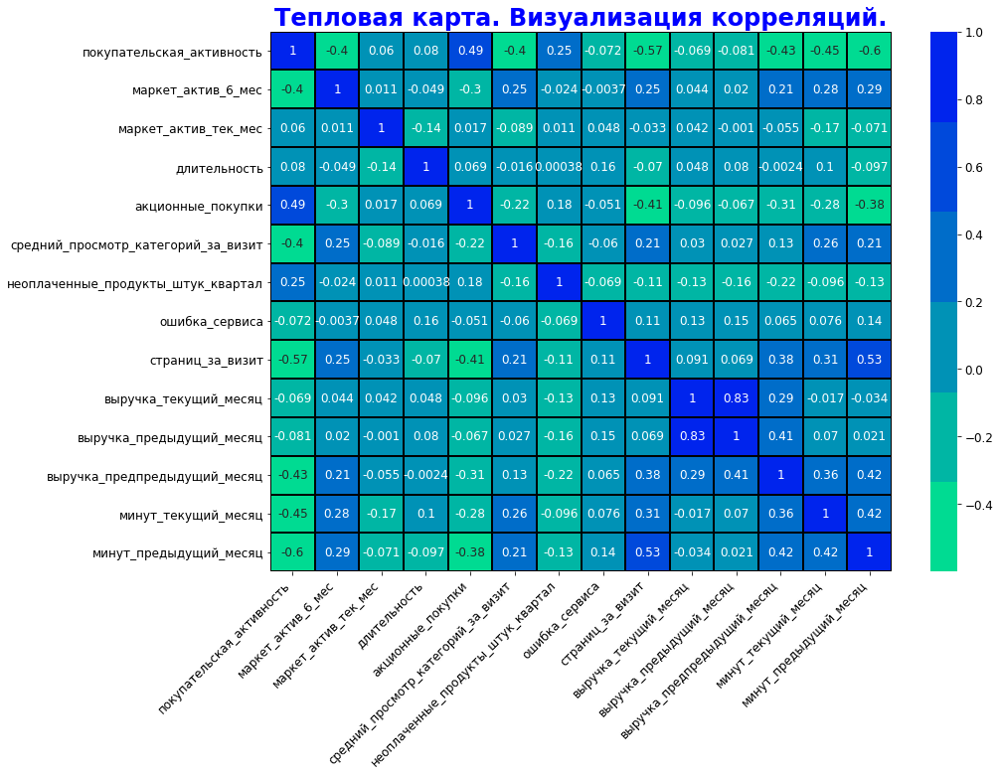

In [99]:
child_product['покупательская_активность'] = child_product['покупательская_активность'].apply(lambda x: 1 if x == 1 else 0)
plt.figure(figsize=(14,10))
colormap = sns.color_palette("winter_r")
plt.rc('font', size= 12) 
chart = sns.heatmap(child_product[child_product.columns[child_product.columns != 'id']].corr(), 
                    annot=True, cmap=colormap, linewidths=1, linecolor='black')
plt.title('Тепловая карта. Визуализация корреляций.', fontsize=24, fontweight="bold", color='blue') 
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

***Выявили основные признаки влияющие на покупательскую активность клиентов из категории «Товары для детей»:***

- Среднемесячное значение маркетинговых коммуникаций компании, которое приходилось на покупателя за последние 6 месяцев. Это значение показывает, какое число рассылок, звонков, показов рекламы и прочего приходилось на клиента (-0.4) 
- Акционные покупки. Это среднемесячная доля покупок по акции от общего числа покупок за последние 6 месяцев (0.49)
- Страниц за визит. Это среднее количество страниц, которые просмотрел покупатель за один визит на сайт за последние 3 месяца (-0.57)
- Минут в текущем месяце. Это значение времени, проведённого на сайте, в текущем месяце (-0.44)
- Минут в предыдущем месяце. Это значение времени, проведённого на сайте, в предыдущем месяце (-0.6)

***Вывод:***

- Исследование показало рост выручки на протяжении 3 месяцев клиентов из категории «Товары для детей»
- У половины клиентов из категории «Товары для детей» снизилась активность покупок
- Только четверть продаж приходиться на клиентов сервиса "премиум" 
- Наибольшее количество клиентов из категории «Товары для детей» приносит прибыль от 3000 до 5000 рублей в месяц
- Заметно влияние на покупательскую способность клиентов из категории «Товары для детей» маргетинговых коммуникаций компании и акционные продажи товаров

***Предложение активнее в дальнейшем использовать влияние этих признаков (маргетинговых коммуникаций компании и акционных продаж товаров) для расширения продаж и привлечения новых клиентов.***

## Шаг 9. Общий вывод

**На этапе предобработка данных увидели:**
- загружена хорошая база данных без пропусков и мусора;
- каких то значительных выбросов в данных не обнаружено;
- найдены явные дубликаты были удалены;
- в датафреймах изменили тип данных. Во всех датафреймах типы данных были загружены корректны.

---

**На этапе исследовательский анализ данных было выявлено:** каких то сильных выбросов / аномалий не обнаружено

---

**На этапе исследовательский анализ данных было выявлено:**

---

**Датафрейм market_file:**

**Числовые признаки**

- `маркет_актив_6 мес:` распределение похоже на нормальное. С локальными незначительными пиками. Среднее - 4.25, Медиана - 4,20, Min - 0,9, Max - 6,60;
- `маркет_актив_тек_мес:` распределение мультимодальное. Наблюдаем три пика: 3.0, 4.0 и 5.0. Среднее - 4.01, Медиана - 4.00, Min - 3.0, Max - 5.00;
- `длительность:` распределение стремится к нормальному. Самый "свежий" пользователь зарегистрировался 110 дней назад. Есть небольшие локальные пики на 200, 500, 800 и около 1000. Среднее - 601.90, Медиана - 606.00, Min - 110.0, Max - 1079.00;
- `акционные_покупки:` распределение бимодальное. Есть часть покупателей, которая за рассматриваемый период имеет долю покупок, совершённых по акции, близкую к единице. Среднее - 0.32, Медиана - 0.24, Min - 0.0, Max - 0.99;
- `средний_просмотр_категорий_за_визит:` распределение похоже на нормальное. Среднее - 3.27, Медиана - 3.00, Min - 1.0, Max - 6.00;

- `неоплаченные_продукты_штук_квартал:` распределение похоже на нормальное, но скошенное. Среднее - 2.84, Медиана - 3.00, Min - 0.0, Max - 10.00;
- `ошибка_сервиса:` распределение нормальное. Среднее - 4.19, Медиана - 4.00, Min - 0.0, Max - 9.00;
- `страниц_за_визит:` распределение нормальное. Среднее - 8.18, Медиана - 8.00, Min - 1.0, Max - 20.00.

**Категориальные признаки**

- `покупательская_активность:` 802 пользователя имеюют прежний_уровень (61.69%), 498 пользователей активность снизилась (38.31%);
- `тип_сервиса:` 924 раза встречается стандарт (71.08%), остальные наблюдения - премиум 376 раз (28.92%);
- `разрешить_сообщать:` 962 раза встречается да (74.00%), остальные наблюдения - 338 раз (26.00%);
- `популярная_категория:` 330 наблюдений - Товары для детей (25.38%), 251 наблюдений - Домашний текстиль (19.31%), 223 наблюдений - Косметика и аксессуары (17.15%), 184 наблюдений - Техника для красоты и здоровья (14,15%), 174 наблюдений - Мелкая бытовая техника и электроника (13,38%), 138 наблюдений - Кухонная посуда (10,62%). 

---

**Датафрейм market_money:**

**Числовые признаки**

- `выручка:` распределение похоже на нормальное. Большинство наблюдений расположены в промежутке 4500-5500. С локальными незначительными пиками. Среднее - 5007.28, Медиана - 4959.00, Min - 2758.7, Max - 7799.4.

**Категориальные признаки**

- `период:` - наблдения распределены поровну, по 1300 (33.33%) между: предыдущий_месяц, текущий_месяц, предпредыдущий_месяц;

---

**Датафрейм market_time:**

**Числовые признаки**

- `минут:` распределение похоже на нормальное. Среднее - 13.34, Медиана - 13.0, Min - 4.0, Max - 23.0.


**Категориальные признаки**

- `период:` - наблдения распределены пополам, по 1300 (50%) между: предыдущий_месяц, текущий_месяц;

---

**Датафрейм money:**

**Числовые признаки**

- `прибыль:` распределение похоже на нормальное. Среднее - 3.99, Медиана - 4.0, Min - 0.86, Max - 7.43.

**Категориальные признаки**

- столбцов с категориальными данными не имеет.

---

**Для поиска лучшей модели:**
* был проведён корреляционный анализ всех признаков с целевым


* был подготовлен объединённый датафрейм для моделирования 


* для выбора лучшей комбинации модели и гиперпараметров был создан пайплайн, в который вошли модели: 
   * **`DecisionTreeClassifier()`** с гиперпараметрами:
    * max_depth от 2 до 4 включительно
    * max_features от 2 до 4 включительно


* **`KNeighborsClassifier()`** с гиперпараметром:
    * n_neighbors от 2 до 4 включительно


* **`LogisticRegression()`**:
    * с решателем `solver='liblinear'` и лассо-регуляризацией с гиперпараметром:
    * С от 1 до 4 включительно


* **`SVC()`**:
    * с линейным ядром `kernel='linear'` с гиперпараметром:

---
**В результате была выбрана лучшая модель:**

* `'preprocessor__num': MinMaxScaler(), 'models__C': 2, 'models': SVC(probability=True, random_state=42)`

Метрика лучшей модели на Кросс валидационной выборке: 0.898

Метрика `ROC-AUC` лучшей модели на тестовой выборке: 0.913

---

Наибольшее влияние на целевой признак "Покупательская активность" оказывают акционные покупки, вероятно клиенты ищут товары по акции и стараются купить товар как можно выгоднее. Также влияют столбцы: предпредущий_время, средний просмотр категорий за визит, и текущий время. Думаю это можно объяснить поведением покупателя. Просто так на сайт заходить не будут, и если кто-то, что-то даже не хотел покупать, но увидит хорошую цену, то обязательно приобретет товар.

---

***Выявили основные признаки влияющие на покупательскую активность клиентов из категории «Товары для детей»:***

- Среднемесячное значение маркетинговых коммуникаций компании, которое приходилось на покупателя за последние 6 месяцев. Это значение показывает, какое число рассылок, звонков, показов рекламы и прочего приходилось на клиента (-0.4) 
- Акционные покупки. Это среднемесячная доля покупок по акции от общего числа покупок за последние 6 месяцев (0.49)
- Страниц за визит. Это среднее количество страниц, которые просмотрел покупатель за один визит на сайт за последние 3 месяца (-0.57)
- Минут в текущем месяце. Это значение времени, проведённого на сайте, в текущем месяце (-0.44)
- Минут в предыдущем месяце. Это значение времени, проведённого на сайте, в предыдущем месяце (-0.6)

---

***Вывод:***

- Исследование показало рост выручки на протяжении 3 месяцев клиентов из категории «Товары для детей»
- У половины клиентов из категории «Товары для детей» снизилась активность покупок
- Только четверть продаж приходиться на клиентов сервиса "премиум" 
- Наибольшее количество клиентов из категории «Товары для детей» приносит прибыль от 3000 до 5000 рублей в месяц
- Заметно влияние на покупательскую способность клиентов из категории «Товары для детей» маргетинговых коммуникаций компании и акционные продажи товаров

***Предложение активнее в дальнейшем использовать влияние этих признаков (маргетинговых коммуникаций компании и акционных продаж товаров) для расширения продаж и привлечения новых клиентов.***